# Read and analyze case 6126 E08 (Ajia) - 3

**BMED320: Methods in biomedical research (IMC-ML)  / 2020-11-11**<br>

See: https://github.com/arvidl/BMED320-imaging-mass-cytometry-ml/blob/master/notebooks/imc-case-damond-2019/README.md

### Import the libraries being used

In [5]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from skimage import io
from skimage import color
from skimage import morphology
from skimage.morphology import disk
from skimage.filters import median
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import ndimage
from skimage.filters import threshold_otsu
from skimage import img_as_ubyte
from skimage import img_as_float
from scipy.ndimage import gaussian_filter
from skimage.morphology import reconstruction
import nibabel as nib
import os
home = os.path.expanduser('~')  # To make path to local home directory
import tifffile as tiff
from pycaret.clustering import *

### Read IMC .csv file into a Pandas dataframe 

In [6]:
dfIMC_fn = './data/BMED320_experiments_case6126_E08_CyTOF_pixels.csv'
dfIMC = pd.read_csv(dfIMC_fn)

In [10]:
inspect = pd.concat([dfIMC.head().T, dfIMC.tail().T], axis=1)
inspect

,0,1,2,3,4,300505,300506,300507,300508,300509
141Pr,1.066,11.754,18.484,15.564,19.813,14.342,30.667,29.274,23.422,16.829
154Sm,0.000,3.143,1.332,3.129,2.000,2.000,2.838,1.853,0.000,4.459
156Gd,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000
159Tb,0.000,1.000,1.275,0.000,0.000,0.000,0.000,0.000,0.000,0.000
153Eu,12.395,8.871,3.000,1.000,0.000,0.000,0.000,0.000,1.029,0.000
169Tm,2.376,5.189,3.032,2.126,3.000,2.000,1.282,1.751,1.344,3.032
158Gd,1.000,0.000,0.000,1.912,0.000,0.000,0.000,2.413,0.000,0.000
167Er,0.000,2.414,0.000,0.000,0.000,0.000,0.000,1.037,0.000,0.000
144Nd,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000
160Gd,4.537,6.969,4.158,0.000,0.000,0.000,0.000,0.000,3.779,0.000


In [34]:
# Select last 2 columns for (row,col) pixel Position
dfPos = dfIMC.iloc[:,-2:]

# Exclude last 2 columns for the CyTOF Data
dfData = dfIMC.iloc[:,:-2]

In [41]:
print(dfPos.info())
print(dfPos.max())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300510 entries, 0 to 300509
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   row     300510 non-null  int64
 1   col     300510 non-null  int64
dtypes: int64(2)
memory usage: 4.6 MB
None
row    529
col    566
dtype: int64


In [35]:
dfData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300510 entries, 0 to 300509
Data columns (total 37 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   141Pr   300510 non-null  float64
 1   154Sm   300510 non-null  float64
 2   156Gd   300510 non-null  float64
 3   159Tb   300510 non-null  float64
 4   153Eu   300510 non-null  float64
 5   169Tm   300510 non-null  float64
 6   158Gd   300510 non-null  float64
 7   167Er   300510 non-null  float64
 8   144Nd   300510 non-null  float64
 9   160Gd   300510 non-null  float64
 10  145Nd   300510 non-null  float64
 11  148Nd   300510 non-null  float64
 12  174Yb   300510 non-null  float64
 13  150Nd   300510 non-null  float64
 14  161Dy   300510 non-null  float64
 15  143Nd   300510 non-null  float64
 16  162Dy   300510 non-null  float64
 17  164Dy   300510 non-null  float64
 18  152Sm   300510 non-null  float64
 19  171Yb   300510 non-null  float64
 20  165Ho   300510 non-null  float64
 21  149Sm   30

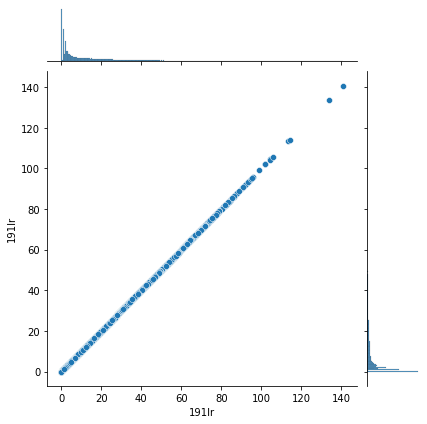

In [48]:
sns.jointplot(x=dfData['191Ir'], y=dfData['191Ir']);
plt.show()

### Correlation between features

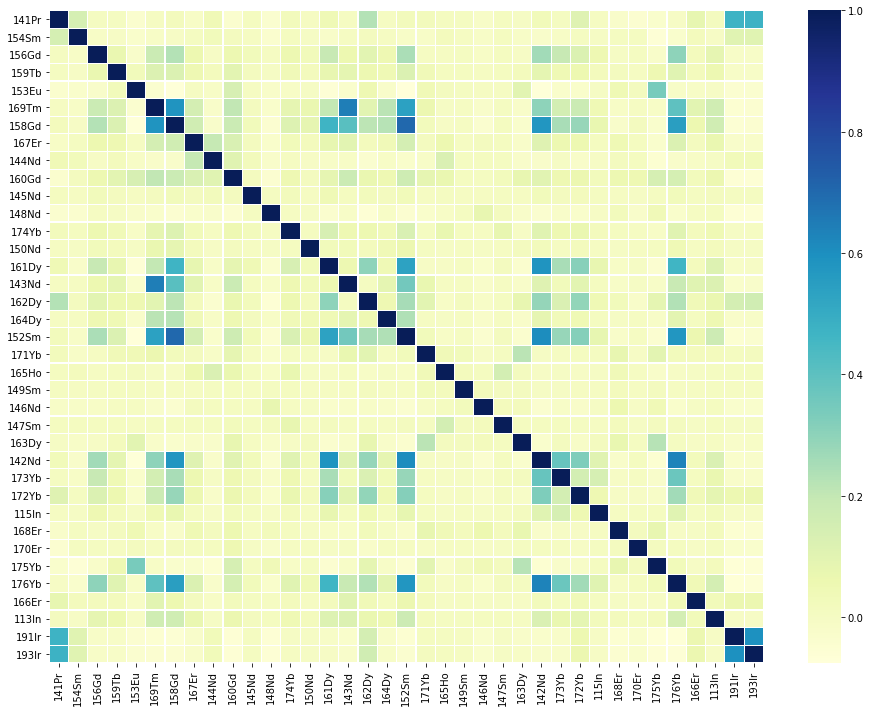

In [53]:
plt.figure(figsize=(16, 12))
#dfData.drop([''191Ir'', '191Ir'], axis=1, inplace=True)
corr = dfData.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
                 linewidths=.2, cmap="YlGnBu")

#### TO DO:  Check out co-localisation (simultaneous presence of Tag_a (i.e. > t_a) and Tag_b (i.e. > t_b) at a given location (i.e. pixel)
#### Co-localiozation maps ?
#### Targeted channels ?

### Define the data being used

In [11]:
fn_tiff = './data/E08_a0_full.tiff'
fn_csv = './data/E08_a0_full.csv'
fn_panel = './data/table1_IMC_panel_37x4.csv'

# For direct inclusion of figures and tables in the Overleaf on Linux / MacOS and NOT Windows ('nt')
# i.e. LaTeX document (Overleaf is synced with Dropbox on MacOS/Linux)
if os.name == 'nt':
    fn_fig_base = '%s/tmp' % home
    fn_tab_base = '%s/tmp' % home
else:    
    fn_fig_base = '%s/Dropbox/Apps/Overleaf/Imaging_Mass_Cytometry_and_Machine_Learning_BMED320_project2020/Figs' % (home)
    fn_tab_base = '%s/Dropbox/Apps/Overleaf/Imaging_Mass_Cytometry_and_Machine_Learning_BMED320_project2020' % (home)

### Read the IMC imagefile and print characteristics

In [12]:
im = io.imread(fn_tiff)
print(type(im))
print(im.shape)

<class 'numpy.ndarray'>
(37, 530, 567)


### Read the IMC dataset panel information into a dataframe and display the table

In [9]:
df_p = pd.read_csv(fn_panel)
print(df_p.shape)
df_p

(37, 4)


,Short Name,Antigen,Main Target Cells,Metal Tag
0,INS,Insulin,β,141Pr
1,PIN,Proinsulin,β,154Sm
2,GCG,Glucagon,α,156Gd
3,SST,Somatostatin,δ,159Tb
4,PPY,Pancreatic polypeptide,γ,153Eu
5,NKX6-1,Homeobox protein Nkx-6.1,β,169Tm
6,PDX1,Pancreatic and duodenal homeobox 1,β δ ductal,158Gd
7,IAPP,Amylin,β,167Er
8,PCSK2,Proprotein convertase 2,α,144Nd
9,SYP,Synaptophysin,Endocrine,160Gd


### Pandas dataframe to LaTeX table
https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.to_latex.html

In [10]:
print(df_p.to_latex(index=True)) 

\begin{tabular}{lllll}
\toprule
{} & Short Name &                                            Antigen &      Main Target Cells & Metal Tag \\
\midrule
0  &        INS &                                            Insulin &                      β &     141Pr \\
1  &        PIN &                                         Proinsulin &                      β &     154Sm \\
2  &        GCG &                                           Glucagon &                      α &     156Gd \\
3  &        SST &                                       Somatostatin &                      δ &     159Tb \\
4  &        PPY &                             Pancreatic polypeptide &                      γ &     153Eu \\
5  &     NKX6-1 &                           Homeobox protein Nkx-6.1 &                      β &     169Tm \\
6  &       PDX1 &                 Pancreatic and duodenal homeobox 1 &             β δ ductal &     158Gd \\
7  &       IAPP &                                             Amylin &                 

### Write latex table directly to file, then use `\input(table.tex)` in Overleaf 
**remember `\usepackage{booktabs}`**

In [11]:
# Replace greek letter with mathematical greek in the Main Target Cells column
df_p_edit = df_p.copy()

old_list = ['α', 'β', 'δ', 'γ', 'β δ ductal']
new_list = ['$\\alpha$', '$\\beta$', '$\\delta$', '$\\gamma$', '$\\beta$ $\\delta$ ductal']
df_p_edit['Main Target Cells'] = df_p_edit['Main Target Cells'].replace(old_list, new_list)

# And add 1 to the index (i.e. channel numbering)
df_p_edit.index = np.arange(1, len(df_p_edit)+1)
#df_p_edit.index.names = ['Channel']
df_p_edit['Channel'] = df_p_edit.index 

# Reorder columns to start with Channel
cols = list(df_p_edit.columns.values)
print(cols)
cols = [df_p_edit.columns[-1]] + [col for col in df_p_edit if col != df_p_edit.columns[-1]]
print(cols)
df_p_edit = df_p_edit[cols]

['Short Name', 'Antigen', 'Main Target Cells', 'Metal Tag', 'Channel']
['Channel', 'Short Name', 'Antigen', 'Main Target Cells', 'Metal Tag']


**Inspect**

In [12]:
df_p_edit

,Channel,Short Name,Antigen,Main Target Cells,Metal Tag
1,1,INS,Insulin,$\beta$,141Pr
2,2,PIN,Proinsulin,$\beta$,154Sm
3,3,GCG,Glucagon,$\alpha$,156Gd
4,4,SST,Somatostatin,$\delta$,159Tb
5,5,PPY,Pancreatic polypeptide,$\gamma$,153Eu
6,6,NKX6-1,Homeobox protein Nkx-6.1,$\beta$,169Tm
7,7,PDX1,Pancreatic and duodenal homeobox 1,$\beta$ $\delta$ ductal,158Gd
8,8,IAPP,Amylin,$\beta$,167Er
9,9,PCSK2,Proprotein convertase 2,$\alpha$,144Nd
10,10,SYP,Synaptophysin,Endocrine,160Gd


**save to file to sync with Overleaf**

In [13]:
tab_fn = '%s/BMED320_experiments_case6126_E08_panel_table.tex' % fn_tab_base
with open(tab_fn, 'w') as tf:
     tf.write(df_p_edit.to_latex(index=False, escape=False))

### Plot the IMC dataset as a 7 x 6 grid of color-coded channels (and save Fig for the Overleaf document)

With histogram equalization for better visualization
https://stackoverflow.com/questions/28518684/histogram-equalization-of-grayscale-images-with-numpy

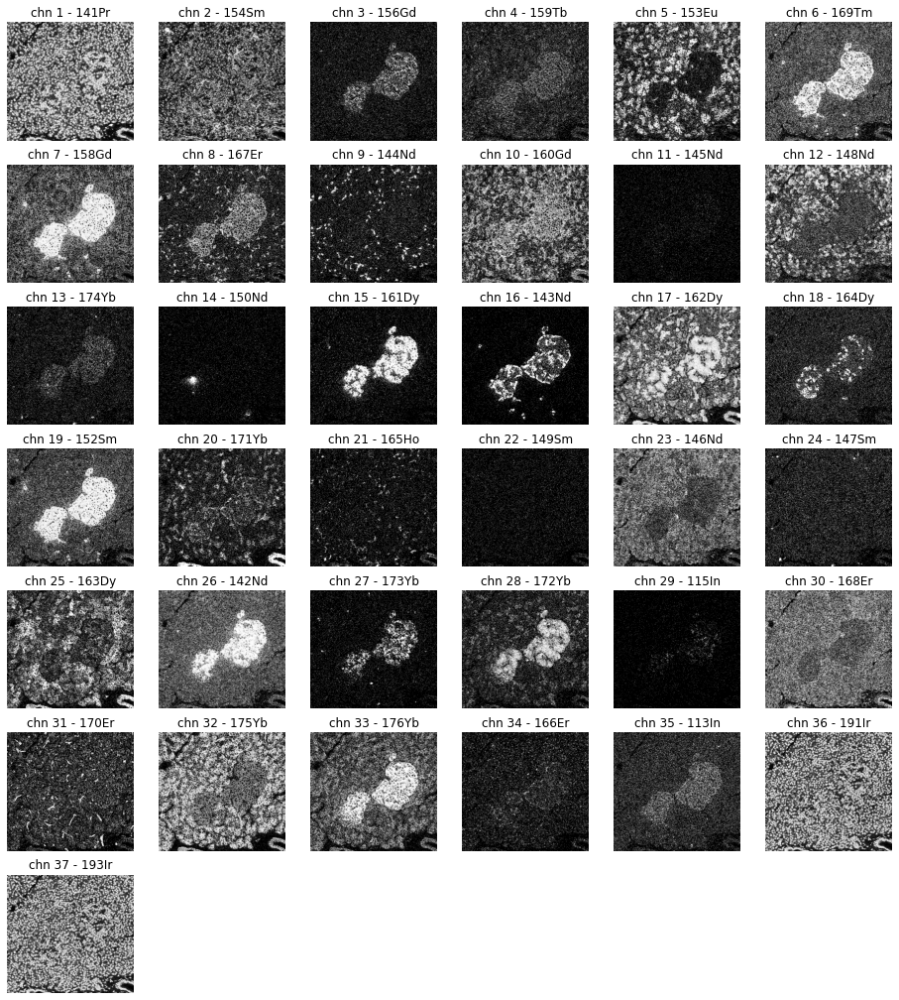

In [16]:
fig_fn = '%s/BMED320_experiments_case6126_E08_channel_eq_mosaic_gray.pdf' % fn_fig_base
fig, axes = plt.subplots(7, 6, figsize=(16, 18), sharex=False, sharey=False)
ax = axes.ravel()
for i, item in enumerate(range(n_chn)):
    chn = np.squeeze(im[i,:,:])
    chn_eq = np.sort(chn.ravel()).searchsorted(chn)
    ax[i].imshow(chn_eq, cmap='gray' )   # cmap='jet', 'gray'
    ax[i].set_title('chn %d - %s' % ((i+1), df_p_edit['Metal Tag'].iloc[i]))
    ax[i].axis('off')
chn_0 = np.zeros(chn.shape )   
for j in range(n_chn,7*6):
    ax[j].imshow(chn_0, cmap='gray_r') 
    ax[j].axis('off')
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

## Prepare the multichannel IMC image for NIFTI format

In [17]:
im.shape

(37, 530, 567)

In [18]:
def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)

In [19]:
imc_img = np.zeros(shape=(im.shape[2], im.shape[1], 1, im.shape[0]))
imc_img_eq = np.zeros(shape=(im.shape[2], im.shape[1], 1, im.shape[0]))
print(imc_img.shape)
for i in range(im.shape[0]):
    a = np.squeeze(im[i,:,:])
    b = np.squeeze(hist_eq(im[i,:,:]))
    imc_img[:,:,0,i] = a[::-1,::-1].T /a.max()
    imc_img_eq[:,:,0,i] = b[::-1,::-1].T /b.max()

(567, 530, 1, 37)


### Make a neuroimaging NIFTI-formated multichannel image 
**(for using neuroimaging display tools like Freesurfer's [FreeView](https://surfer.nmr.mgh.harvard.edu/fswiki/FreeviewGuide/FreeviewGeneralUsage/FreeviewInterface) or FSL's [FSLeyes](https://users.fmrib.ox.ac.uk/~paulmc/fsleyes/userdoc/latest)**

In [20]:
imc_nii = nib.Nifti1Image(imc_img, affine=np.eye(4))
imc_nii_eq = nib.Nifti1Image(imc_img_eq, affine=np.eye(4))  # "histogram equalized channels" image

#### Save this NIFTI image to disk

In [21]:
nib.save(imc_nii, './data/imc_%d_chns.nii.gz' % (im.shape[0]))
nib.save(imc_nii_eq, './data/imc_%d_chns_eq.nii.gz' % (im.shape[0]))

# K-means clustering using `PyCaret`

PyCaret’s Clustering Module is an unsupervised machine learning module that performs the task of grouping a set of objects in such a way that objects in the same group (also known as a cluster) are more similar to each other than to those in other groups. This module provides several [pre-processing](https://pycaret.org/preprocessing) features that prepare the data for modeling through [setup](https://pycaret.org/setup) function. It has over 8 ready-to-use algorithms and [several plots](https://pycaret.org/plot-model) to analyze the results of trained models.


The elbow method is a heuristic method of interpretation and validation of consistency within cluster analysis designed to help find the appropriate number of clusters in a dataset.

Silhouette is a method of interpretation and validation of consistency within clusters of data. The technique provides a succinct graphical representation of how well each object has been classified. In other words, the silhouette value is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html


```Python
# create a model
kmeans = create_model('kmeans')

# assign labels using trained model
kmeans_df = assign_model(kmeans)

# plot a model
plot_model(kmeans) 

```

https://github.com/pycaret/pycaret/blob/master/tutorials/Clustering%20Tutorial%20Level%20Beginner%20-%20CLU101.ipynb

In [22]:
from pycaret.utils import version
version()

'2.2.0'

In [23]:
# We let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

In [24]:
# Find voxel locations (ind_roi) corresponding to tissue ROI (value >=1 inside ROI, 0 else) 
ind_roi = np.where(im_msk > 0) 
X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
print(X.shape)

(300510, 37)


In [25]:
# Define Pandas dataframe with feature vectors being the CyTOF pixel signatures
dfX = pd.DataFrame(X)
dfX

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36
0,1.066000,0.000,0.0,0.000,12.395,2.376,1.000,0.000,0.0,4.537,0.0,1.047,0.0,0.000,1.0,0.0,2.360,1.000,2.000,5.076,0.0,0.000,0.000,0.0,2.353,0.000,0.000,0.000,0.0,4.739,2.000,62.405998,6.346,0.000,1.0,2.414000,0.000000
1,11.754000,3.143,0.0,1.000,8.871,5.189,0.000,2.414,0.0,6.969,0.0,1.000,0.0,0.000,0.0,0.0,5.144,1.395,1.000,4.413,0.0,1.802,2.234,0.0,3.367,2.397,0.000,2.926,0.0,2.002,0.000,13.208000,5.364,0.000,0.0,4.589000,18.249001
2,18.483999,1.332,0.0,1.275,3.000,3.032,0.000,0.000,0.0,4.158,0.0,1.000,0.0,0.000,0.0,0.0,16.028,0.000,0.000,2.304,0.0,0.000,1.018,0.0,4.268,2.000,1.923,2.928,0.0,6.211,0.000,1.000000,1.000,0.000,0.0,52.974998,66.415001
3,15.564000,3.129,0.0,0.000,1.000,2.126,1.912,0.000,1.0,0.000,0.0,0.000,0.0,0.000,0.0,0.0,6.460,0.000,0.000,1.000,0.0,0.000,2.117,0.0,1.000,1.000,0.000,5.424,0.0,0.000,0.000,0.000000,0.000,1.146,0.0,39.678001,81.518997
4,19.813000,2.000,0.0,0.000,0.000,3.000,0.000,0.000,0.0,0.000,0.0,2.111,1.0,0.000,0.0,0.0,15.524,0.000,0.000,0.000,0.0,1.000,0.000,0.0,1.000,0.000,0.000,5.394,0.0,2.637,0.536,0.000000,1.000,0.000,0.0,31.754999,80.593002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300505,14.342000,2.000,0.0,0.000,0.000,2.000,0.000,0.000,0.0,0.000,0.0,0.000,1.0,1.247,1.0,0.0,5.784,0.000,0.000,0.000,0.0,0.000,1.000,0.0,2.914,0.000,0.000,0.000,0.0,0.000,0.000,1.000000,0.000,0.000,0.0,25.278999,54.415001
300506,30.667000,2.838,0.0,0.000,0.000,1.282,0.000,0.000,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.0,11.417,0.000,1.074,2.000,0.0,0.000,0.000,0.0,2.287,0.000,0.000,0.000,0.0,0.000,0.000,6.564000,1.000,0.000,0.0,38.176998,88.170998
300507,29.274000,1.853,1.0,0.000,0.000,1.751,2.413,1.037,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.0,9.543,0.000,0.000,5.794,0.0,0.000,0.000,0.0,3.000,0.000,0.000,0.000,0.0,2.000,0.000,10.933000,3.000,0.000,1.0,30.969999,59.962002
300508,23.422001,0.000,0.0,0.000,1.029,1.344,0.000,0.000,0.0,3.779,0.0,0.000,0.0,0.000,0.0,0.0,2.939,0.000,0.000,6.554,0.0,0.000,1.314,0.0,11.875,1.000,0.000,0.000,0.0,0.000,0.000,9.376000,0.000,0.000,0.0,20.679001,35.198002


### Import clustering module

In [26]:
from pycaret.clustering import *

### Initialize the setup

This function initializes the environment in pycaret. setup() must called before executing any other function in pycaret. It takes one mandatory parameter: dataframe {array-like, sparse matrix}.

Common to all modules in PyCaret, setup is the first and the only mandatory step to start any machine learning experiment. Besides performing some basic processing tasks by default, PyCaret also offers wide array of pre-processing features which structurally elevates an average machine learning experiment to an advanced solution. Elaborate details of all the pre-processing features can be found [here](https://pycaret.org/preprocessing). 

**Normalization** is a technique often applied as part of data preparation for machine learning. The goal of normalization is to rescale the values of numeric columns in the dataset without distorting differences in the ranges of values or losing information. This can be achieved in PyCaret using normalize parameter within setup. There are several methods available for normalization, by default it uses ‘zscore’ (calculated as z = (x – u) / s) to normalize the data, which can be changed using normalize_method parameter within setup.

Listed below are the essential default tasks performed by PyCaret when you initialize the setup:

**Parameters:**
- data : dataframe.
{array-like, sparse matrix}, shape (n_samples, n_features) where n_samples is the number of samples and n_features is the number of features in dataframe.
- normalize: bool, default = False.
When set to True, the feature space is transformed using the normalized_method param. Generally, linear algorithms perform better with normalized data however,  the results may vary and it is advised to run multiple experiments to evaluate the benefit of normalization.
- normalize_method: string, default = ‘zscore’.
Defines the method to be used for normalization. By default, normalize method is set to ‘zscore’. The standard zscore is calculated as z = (x – u) / s. The other available options are:
  - ‘minmax’ : scales and translates each feature individually such that it is in the range of 0 – 1.
  - ‘maxabs’ : scales and translates each feature individually such that the maximal absolute value of each feature will be 1.0. It does not shift/center the data, and thus does not destroy any sparsity.
  - ‘robust’ : scales and translates each feature according to the Interquartile range. When the dataset contains outliers, robust scaler often gives better results.

**Data Type Inference:**  Any experiment performed in PyCaret begins with determining the correct data types for all features. The setup function performs essential inferences about the data and performs several downstream tasks such as ignoring ID and Date columns, categorical encoding, missing values imputation based on the data type inferred by PyCaret’s internal algorithm. Once the setup is executed a dialogue box (see below) appears with the list of all the features and their inferred data types. Data type inferences are usually correct but once the dialogue box appears, user should review the list for accuracy. If all the data types are inferred correctly you may press enter to continue or if not you may type ‘quit‘ to stop the experiment. We have tested correct, and therefore put `silent=True`, i.e. confirmation of data types is not required. All preprocessing will be performed assuming automatically inferred data types. 

**Returns:**
- Information Grid: Information grid is printed.
- Environment: This function returns various outputs that are stored in variable as tuple. They are used by other functions in pycaret.

In [27]:
%%time
exp_clu = setup(data=dfX, silent=True, normalize=True, normalize_method='zscore', n_jobs=-1)

,Description,Value
0,session_id,3682
1,Original Data,"(300510, 37)"
2,Missing Values,False
3,Numeric Features,37
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(300510, 37)"
9,CPU Jobs,-1


CPU times: user 1.86 s, sys: 100 ms, total: 1.96 s
Wall time: 1.96 s


In [28]:
# exp_clu

**Before z-score normalization**

In [29]:
dfX.describe().T

,count,mean,std,min,25%,50%,75%,max
0,300510.0,8.517661,9.972184,0.0,2.008,5.181,11.713000,377.167999
1,300510.0,1.021032,1.811578,0.0,0.000,0.000,1.361000,84.235001
2,300510.0,0.202481,0.604651,0.0,0.000,0.000,0.000000,24.330000
3,300510.0,0.301524,0.681201,0.0,0.000,0.000,0.000000,13.905000
4,300510.0,1.285179,2.914566,0.0,0.000,0.000,1.247000,71.648003
5,300510.0,2.059365,5.361103,0.0,0.000,1.000,2.000000,241.634995
6,300510.0,4.323402,10.215173,0.0,0.000,1.000,2.946000,164.412003
7,300510.0,0.515797,1.319561,0.0,0.000,0.000,1.000000,59.875000
8,300510.0,0.383917,2.135539,0.0,0.000,0.000,0.000000,136.531006
9,300510.0,1.311738,1.943014,0.0,0.000,1.000,2.000000,58.181999


**After z-score normalization**

In [30]:
# Find entry number, e for the zero-mean unit variance 'Transformed Data'
for e in range(50):
    try:
        exp_clu[e][1][0]
    except:
        pass
        # print(e,'is invalid')
    else:
        # print(e,'is valid')
        if exp_clu[e][1][0] == 'Transformed Data':
            # print(exp_clu[e][1][0])
            break
        else:
            #print(e)
            continue

exp_clu[e][1][0]

'Transformed Data'

In [31]:
dfX_nor = exp_clu[e][1][1]
dfX_nor.describe().T

,count,mean,std,min,25%,50%,75%,max
0,300510.0,-1.421737e-09,1.000002,-0.854143,-0.652783,-0.334597,0.320426,36.967922
1,300510.0,1.015526e-10,1.000002,-0.563615,-0.563615,-0.563615,0.187664,45.934586
2,300510.0,1.706084e-08,1.000002,-0.334873,-0.334873,-0.334873,-0.334873,39.903294
3,300510.0,-2.477884e-08,1.000002,-0.442636,-0.442636,-0.442636,-0.442636,19.969873
4,300510.0,2.274779e-08,1.000002,-0.440951,-0.440951,-0.440951,-0.013099,24.141823
5,300510.0,8.124210e-09,1.000002,-0.384131,-0.384131,-0.197602,-0.011073,44.687820
6,300510.0,2.112295e-08,1.000002,-0.423234,-0.423234,-0.325340,-0.134839,15.671676
7,300510.0,1.533445e-08,1.000002,-0.390886,-0.390886,-0.390886,0.366944,44.984135
8,300510.0,1.523289e-08,1.000002,-0.179775,-0.179775,-0.179775,-0.179775,63.753136
9,300510.0,8.124210e-09,1.000002,-0.675106,-0.675106,-0.160440,0.354225,29.269150


### Create k-means model

This function creates a model on the dataset passed as a data param during the setup stage. setup() function must be called before using create_model(). This function returns a trained model object.

**Parameters:**

- num_clusters: int, default = None.
Number of clusters to be generated with the dataset. If None, num_clusters is set to 4.

**Returns:**

- Score grid: A table containing the Silhouette, Calinski-Harabasz, Davies-Bouldin, Homogeneity Score, Rand Index, and Completeness Score. Last 3 are only evaluated when ground_truth param is provided.
- Model: Trained model object

**k = 2**

In [32]:
%%time
kmeans2 = create_model('kmeans', num_clusters=2)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4449,33752.7263,1.8707,0,0,0


CPU times: user 1h 9min 19s, sys: 47.1 s, total: 1h 10min 6s
Wall time: 14min 55s


In [33]:
print(kmeans2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=3682, tol=0.0001, verbose=0)


In [34]:
kmeans2_results = assign_model(kmeans2)

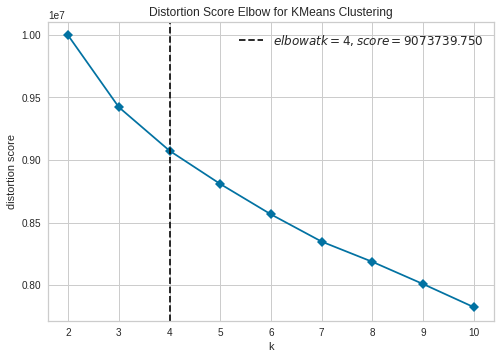

CPU times: user 9min 47s, sys: 6.64 s, total: 9min 54s
Wall time: 41.9 s


In [35]:
%%time
plot_model(kmeans2, plot='elbow')

In [37]:
#%%time
#plot_model(kmeans2, plot='silhouette')

**k = 3**

In [38]:
#%%time
#kmeans3 = create_model('kmeans', num_clusters=3)

In [39]:
#print(kmeans3)

In [40]:
#kmeans3_results = assign_model(kmeans3)

In [41]:
#%%time
#plot_model(kmeans3, plot='elbow')

In [42]:
#%%time
#plot_model(kmeans3, plot='silhouette')

**k = 4**

In [43]:
#%%time
#kmeans4 = create_model('kmeans', num_clusters=4)

In [44]:
#print(kmeans4)

In [45]:
#kmeans4_results = assign_model(kmeans4)

In [46]:
#%%time
#plot_model(kmeans4, plot='elbow')

In [47]:
#%%time
#plot_model(kmeans4, plot='silhouette')

# K-means clustering using `scikit-learn`

Conventional _k_-means requires only a few steps. The first step is to randomly select _k_ centroids, where _k_ is equal to the number of clusters you choose. **Centroids** are data points representing the center of a cluster.

The main element of the algorithm works by a two-step process called **expectation-maximization**. The expectation step assigns each data point to its nearest centroid. Then, the maximization step computes the mean of all the points for each cluster and sets the new centroid. Here’s what the conventional version of the k-means algorithm looks like:

![kmeans-algorithm](https://files.realpython.com/media/kmeans-algorithm.a94498a7ecd2.png)

The quality of the cluster assignments is determined by computing the **sum of the squared error** (**SSE**) after the centroids converge, or match the previous iteration’s assignment. The SSE is defined as the sum of the squared Euclidean distances of each point to its closest centroid. Since this is a measure of error, the objective of _k_-means is to try to minimize this value.

From: https://realpython.com/k-means-clustering-python

### Analyses of all channels jointly (K-means clustering)

In [126]:
# Min and max and number of voxels in the 2D IMC multichannel image
print('Min:', im.flatten().min())
print('Max:', im.flatten().max())
print('Number of voxels:', im.flatten().size)

Min: 0.0
Max: 1473.511
Number of voxels: 11118870


In [127]:
# Generally, we could use a tissue ROI mask for the slide. 
# We let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

**Find all pixel locations in the ROI for extracting a dataset X and corresponding pixel locations to a Pandas data frame (dfROI)**

In [142]:
# Find voxel locations (ind_roi) corresponding to tissue ROI (value >=1 inside ROI, 0 else) 
ind_roi = np.where(im_msk > 0) 
X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
print(X.shape)

(300510, 37)


In [148]:
# Check feature vectors (CyTOF pixel signatures) for the three first pixels
chn_names =  df_p_edit['Metal Tag']
dfROI = pd.DataFrame(X, columns=chn_names)
dfROI.head(3)

Metal Tag,141Pr,154Sm,156Gd,159Tb,153Eu,169Tm,158Gd,167Er,144Nd,160Gd,...,172Yb,115In,168Er,170Er,175Yb,176Yb,166Er,113In,191Ir,193Ir
0,1.066000,0.000,0.0,0.000,12.395,2.376,1.0,0.000,0.0,4.537,...,0.000,0.0,4.739,2.0,62.405998,6.346,0.0,1.0,2.414000,0.000000
1,11.754000,3.143,0.0,1.000,8.871,5.189,0.0,2.414,0.0,6.969,...,2.926,0.0,2.002,0.0,13.208000,5.364,0.0,0.0,4.589000,18.249001
2,18.483999,1.332,0.0,1.275,3.000,3.032,0.0,0.000,0.0,4.158,...,2.928,0.0,6.211,0.0,1.000000,1.000,0.0,0.0,52.974998,66.415001


In [149]:
# The three last pixels signatures in the enumeration
dfROI.tail(3)

Metal Tag,141Pr,154Sm,156Gd,159Tb,153Eu,169Tm,158Gd,167Er,144Nd,160Gd,...,172Yb,115In,168Er,170Er,175Yb,176Yb,166Er,113In,191Ir,193Ir
300507,29.274000,1.853,1.0,0.0,0.000,1.751,2.413,1.037,0.0,0.000,...,0.0,0.0,2.0,0.0,10.933,3.000,0.0,1.0,30.969999,59.962002
300508,23.422001,0.000,0.0,0.0,1.029,1.344,0.000,0.000,0.0,3.779,...,0.0,0.0,0.0,0.0,9.376,0.000,0.0,0.0,20.679001,35.198002
300509,16.829000,4.459,0.0,0.0,0.000,3.032,0.000,0.000,0.0,0.000,...,0.0,0.0,1.0,0.0,11.806,2.758,0.0,1.0,12.137000,27.128000


**Insert pixel locations in the ROI**

In [150]:
dfROI.insert(loc = len(dfROI.columns),
           column = 'row',
           value = ind_roi[0])  # Row of pixel location
dfROI.insert(loc = len(dfROI.columns),
           column = 'col',
           value = ind_roi[1])  # Col of pixel location

In [151]:
dfROI.describe().T

,count,mean,std,min,25%,50%,75%,max
Metal Tag,,,,,,,,
141Pr,300510.0,8.517661,9.972184,0.0,2.008,5.181,11.713000,377.167999
154Sm,300510.0,1.021032,1.811578,0.0,0.000,0.000,1.361000,84.235001
156Gd,300510.0,0.202481,0.604651,0.0,0.000,0.000,0.000000,24.330000
159Tb,300510.0,0.301524,0.681201,0.0,0.000,0.000,0.000000,13.905000
153Eu,300510.0,1.285179,2.914566,0.0,0.000,0.000,1.247000,71.648003
169Tm,300510.0,2.059365,5.361103,0.0,0.000,1.000,2.000000,241.634995
158Gd,300510.0,4.323402,10.215173,0.0,0.000,1.000,2.946000,164.412003
167Er,300510.0,0.515797,1.319561,0.0,0.000,0.000,1.000000,59.875000
144Nd,300510.0,0.383917,2.135539,0.0,0.000,0.000,0.000000,136.531006


In [152]:
dfROI_fn = './data/BMED320_experiments_case6126_E08_CyTOF_pixels.csv'
dfROI.to_csv(dfROI_fn, encoding='utf-8', index=False)

### Unsupervised classification of the 2D+CyTOF IMC data using K-means
Let X be the n x p data matrix, n = numper of samples (pixel signatures), p = feature vector dimension (number of channels)

In [153]:
X.shape

(300510, 37)

In [154]:
#chn_names = df.chn
chn_names[:5]

1    141Pr
2    154Sm
3    156Gd
4    159Tb
5    153Eu
Name: Metal Tag, dtype: object

#### Make data frame from unscaled X to check scaling

In [155]:
dX_unscaled = pd.DataFrame(X, columns=chn_names)
dX_unscaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
Metal Tag,,,,,,
141Pr,300510.0,8.5177,9.9722,0.0,5.181,377.1680
154Sm,300510.0,1.0210,1.8116,0.0,0.000,84.2350
156Gd,300510.0,0.2025,0.6047,0.0,0.000,24.3300
159Tb,300510.0,0.3015,0.6812,0.0,0.000,13.9050
153Eu,300510.0,1.2852,2.9146,0.0,0.000,71.6480
169Tm,300510.0,2.0594,5.3611,0.0,1.000,241.6350
158Gd,300510.0,4.3234,10.2152,0.0,1.000,164.4120
167Er,300510.0,0.5158,1.3196,0.0,0.000,59.8750
144Nd,300510.0,0.3839,2.1355,0.0,0.000,136.5310


### Scaling* of feature vectors (IMC signals), channel-by-channel wthin the ROI mask
*) Scaling to zero mean and unit standard deviation

In [156]:
scaler = StandardScaler()  
scaler.fit(X.astype(float))

X_scaled = scaler.transform(X.astype(float))  

# Make data frame from scaled X to check scaling
dX_scaled = pd.DataFrame(X_scaled, columns=chn_names)
dX_scaled.head().T

,0,1,2,3,4
Metal Tag,,,,,
141Pr,-0.747246,0.324537,0.999415,0.706600,1.132686
154Sm,-0.563615,1.171339,0.171656,1.163610,0.540396
156Gd,-0.334873,-0.334873,-0.334873,-0.334873,-0.334873
159Tb,-0.442636,1.025362,1.429061,-0.442636,-0.442636
153Eu,3.811833,2.602732,0.588363,-0.097846,-0.440951
169Tm,0.059062,0.583768,0.181425,0.012429,0.175456
158Gd,-0.325340,-0.423234,-0.423234,-0.236061,-0.423234
167Er,-0.390886,1.438514,-0.390886,-0.390886,-0.390886
144Nd,-0.179775,-0.179775,-0.179775,0.288491,-0.179775


In [157]:
dX_scaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
Metal Tag,,,,,,
141Pr,300510.0,0.0,1.0,-0.8541,-0.3346,36.9679
154Sm,300510.0,-0.0,1.0,-0.5636,-0.5636,45.9346
156Gd,300510.0,-0.0,1.0,-0.3349,-0.3349,39.9033
159Tb,300510.0,-0.0,1.0,-0.4426,-0.4426,19.9699
153Eu,300510.0,-0.0,1.0,-0.4410,-0.4410,24.1418
169Tm,300510.0,-0.0,1.0,-0.3841,-0.1976,44.6878
158Gd,300510.0,0.0,1.0,-0.4232,-0.3253,15.6717
167Er,300510.0,0.0,1.0,-0.3909,-0.3909,44.9841
144Nd,300510.0,-0.0,1.0,-0.1798,-0.1798,63.7531


**Fit the K-means model to the data (and time it)**

In [158]:
K = 3  # Number of clusters (7 is "nice")
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs='deprecated',
       precompute_distances='deprecated', random_state=42, tol=0.0001,
       verbose=0)


In [159]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 30.8 s, sys: 232 ms, total: 31 s
Wall time: 2.06 s


In [160]:
print(kmeans_fit.labels_)
print('First centroid in p-dimensional feature vector space:\n', kmeans_fit.cluster_centers_[0,:])

[1 1 2 ... 2 2 2]
First centroid in p-dimensional feature vector space:
 [-0.0490794  -0.12950276  1.24679613  0.68843688 -0.31644633  2.0320387
  2.76417852  0.82547607 -0.04782499  0.85367874  0.20587082 -0.16624042
  0.5132456   0.13726019  1.51509563  1.38012404  1.00476985  0.89965362
  2.89867031  0.18657654  0.00714536  0.04953365 -0.05522623  0.07755037
 -0.12855642  1.84007121  1.41953496  1.4951212   0.51681775 -0.06527434
  0.0678662  -0.21092321  2.31320312  0.17855404  0.78949861 -0.34773327
 -0.35622451]


In [161]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


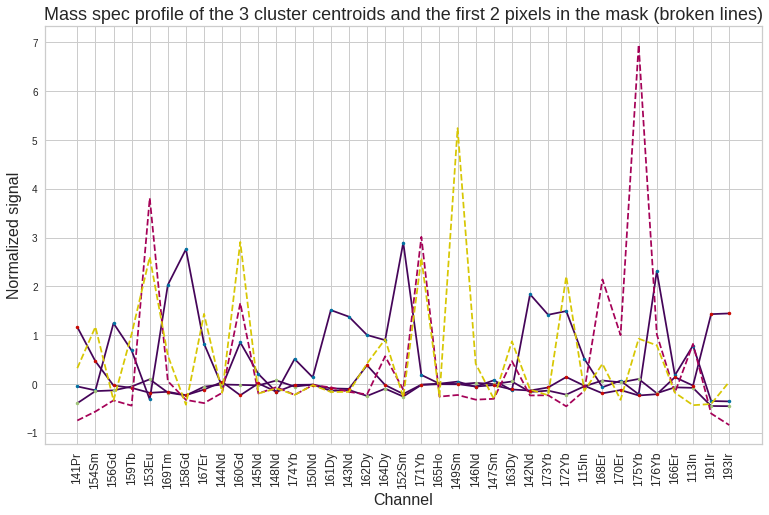

In [165]:
# Plot the cluster centroids as line plots

nv = 2

my_cmap = mpl.colors.ListedColormap(['red', '#000000','#444444', '#666666', '#ffffff', 'blue', 'orange'])
my_cmap_v = plt.cm.viridis(K)

fig, ax = plt.subplots(1,1)

fig.set_size_inches(12, 7)

plt.plot(kmeans_fit.cluster_centers_.T, color=my_cmap_v)
plt.plot(kmeans_fit.cluster_centers_.T, '.')
plt.plot(X_scaled[:nv, :].T, '--')
plt.xlabel('Channel', fontsize=16)
ax.set_xticks([x for x in range(X_scaled.shape[1])])
ax.set_xticklabels(chn_names, rotation='vertical', fontsize=12)
plt.ylabel('Normalized signal', fontsize=16)
#plt.xlim(0, 3)
plt.title('Mass spec profile of the %d cluster centroids and the first %d pixels in the mask (broken lines)' % (K, nv), fontsize=18)

plt.subplots_adjust(bottom=.12, top=.95, right=.95, left=.12)

plt.show()

**Make a k-means segmented image (segmentation restricted to the ROI)**

In [64]:
kmeans_segm = 0 * im_msk.copy()
print('Size of segmented image:', kmeans_segm.shape)
print('min:', kmeans_fit.labels_.min())
print('max:', kmeans_fit.labels_.max())
print('Number of clustered samples within ROI:', len(ind_roi[0]))

Size of segmented image: (530, 567)
min: 0
max: 2
Number of clustered samples within ROI: 300510


**Assign the cluster belonging to each voxel within the ROI**

In [65]:
for v in range(len(ind_roi[0])):
    kmeans_segm[ind_roi[0][v], ind_roi[1][v]] = kmeans_fit.labels_[v]

In [66]:
# https://gist.github.com/jakevdp/91077b0cae40f8f8244a  By Jake VanderPlas
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)

findfont: Font family ['times new roman'] not found. Falling back to DejaVu Sans.


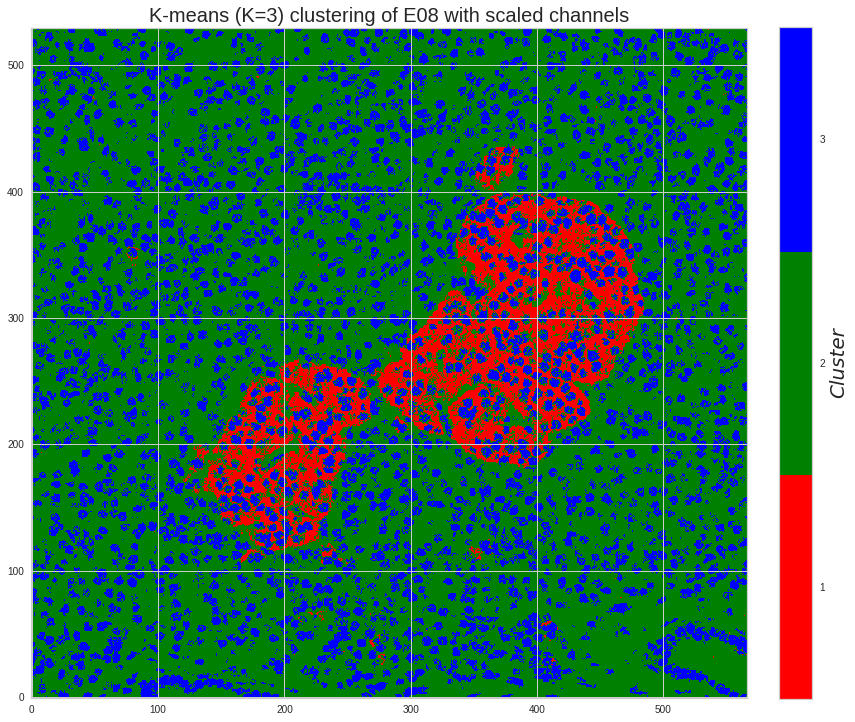

In [67]:
fig_fn = '%s/BMED320_experiments_case6126_E08_K_means_clustering_with_K_3.pdf' % fn_fig_base

fig, axes = plt.subplots(1,1, figsize=(14,14))

# Possible colormaps: 'gray', 'jet', 'cubehelix', 
if K==7:
    my_cmap = mpl.colors.ListedColormap(['red', '#000000','#444444', '#666666', '#ffffff', 'blue', 'orange'])
elif K==3:
    my_cmap = mpl.colors.ListedColormap(['red','green','blue'])
else:
    my_cmap = 'jet'
    
#plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=discrete_cmap(K, 'gray'), origin='lower') 
plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=my_cmap, origin='lower') 

# See: https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
im_ratio = kmeans_segm.shape[0]/kmeans_segm.shape[1]
cb = plt.colorbar(label='Cluster', orientation='vertical', fraction=0.046*im_ratio, pad=0.04)
ax = cb.ax
text = ax.yaxis.label
font = mpl.font_manager.FontProperties(family='times new roman', style='italic', size=20)
text.set_font_properties(font)

plt.clim(-0.5, K - 0.5)
labels = np.arange(0,K,1)
cb.set_ticks(labels)
cb.set_ticklabels(labels+1)  # cluster numbering from 1,2,...,K
plt.title('K-means (K=%d) clustering of E08 with scaled channels' % (K), size=20)
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

### Choosing the Appropriate Number of Clusters
There are two methods that are commonly used to evaluate the appropriate number of clusters:

- The **elbow method**
- The **silhouette coefficient**

These are often used as complementary evaluation techniques rather than one being preferred over the other. 




To perform the **elbow method**, run several _k_-means, increment _k_ with each iteration, and record the SSE:

In [68]:
%%time
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(X_scaled)
    print('K =', k, 'SSE =', kmeans.inertia_)
    sse.append(kmeans.inertia_)

K = 1 SSE = 11118870.00000393
K = 2 SSE = 9995951.916494936
K = 3 SSE = 9421984.75253879
K = 4 SSE = 9073730.691493927
K = 5 SSE = 8812626.710806435
K = 6 SSE = 8590533.339506952
K = 7 SSE = 8408911.826502776
K = 8 SSE = 8188282.397457687
K = 9 SSE = 8061194.008143309
K = 10 SSE = 7901750.555723438
CPU times: user 9min 12s, sys: 5.45 s, total: 9min 18s
Wall time: 35.6 s


There’s a sweet spot where the SSE curve starts to bend known as the **elbow point**. The x-value of this point is thought to be a reasonable trade-off between error and number of clusters. 

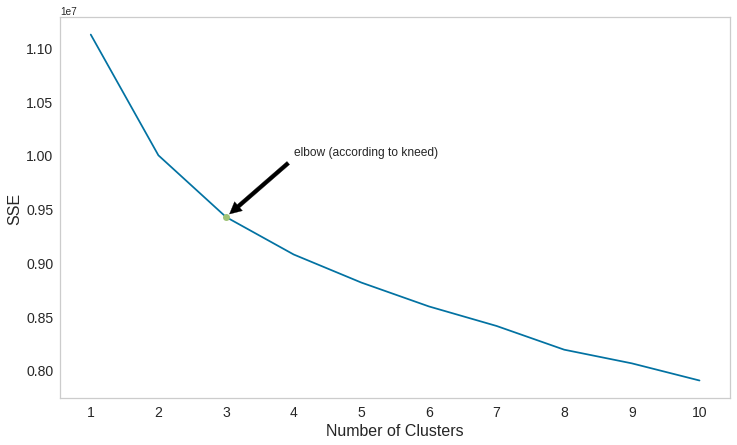

In [69]:
fig_fn = '%s/BMED320_experiments_case6126_E08_kneed_elbow_number_of_clusters.pdf' % fn_fig_base

fig, ax = plt.subplots(1,1)
fig.set_size_inches(12, 7)
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters", size=16)
plt.ylabel("SSE", size=16)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)

#annotation
plt.plot([3], [sse[3-1]], 'o')
plt.annotate('elbow (according to kneed)', xy=(3, sse[3-1]), xytext=(3+1, sse[3-2]), fontsize=12,
            arrowprops=dict(facecolor='black', shrink=0.05))

plt.grid()
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

If the elbow point of the curve is difficult to decide, one could use the Python package [`kneed`](https://github.com/arvkevi/kneed), to identify the elbow point programmatically.

In [70]:
from kneed import KneeLocator
kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)

print('Sweet spot elbow point: K=', kl.elbow)

Sweet spot elbow point: K= 3


The **silhouette coefficient** is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:

- How close the data point is to other points in the cluster
- How far away the data point is from points in other clusters
Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In the scikit-learn [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html) of the silhouette coefficient, the average silhouette coefficient of all the samples is summarized into one score. The silhouette score() function needs a minimum of two clusters, or it will raise an exception. More specifically:

The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1.

The value of the Silhouette score varies from -1 to 1. If the score is 1, the cluster is dense and well-separated than other clusters. A value near 0 represents overlapping clusters with samples very close to the decision boundary of the neighboring clusters. A negative score [-1, 0] indicates that the samples might have got assigned to the wrong clusters.

The Python scikit-learn package supports the following different methods for evaluating Silhouette scores.

- [silhouette_score](https://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient) (sklearn.metrics) for the data set is used for measuring the mean of the Silhouette Coefficient for each sample belonging to different clusters.
- [silhouette_samples](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_samples.html) (sklearn.metrics) provides the Silhouette scores for each sample of different clusters.

Sources to consult:<br>
- https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
- https://towardsdatascience.com/silhouette-method-better-than-elbow-method-to-find-optimal-clusters-378d62ff6891
- https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

**Test example from scikit-learn:**

For n_clusters = 2 The average silhouette_score is : 0.7049787496083262
For n_clusters = 3 The average silhouette_score is : 0.5882004012129721
For n_clusters = 4 The average silhouette_score is : 0.6505186632729437
For n_clusters = 5 The average silhouette_score is : 0.5745566973301872
For n_clusters = 6 The average silhouette_score is : 0.4387644975296138


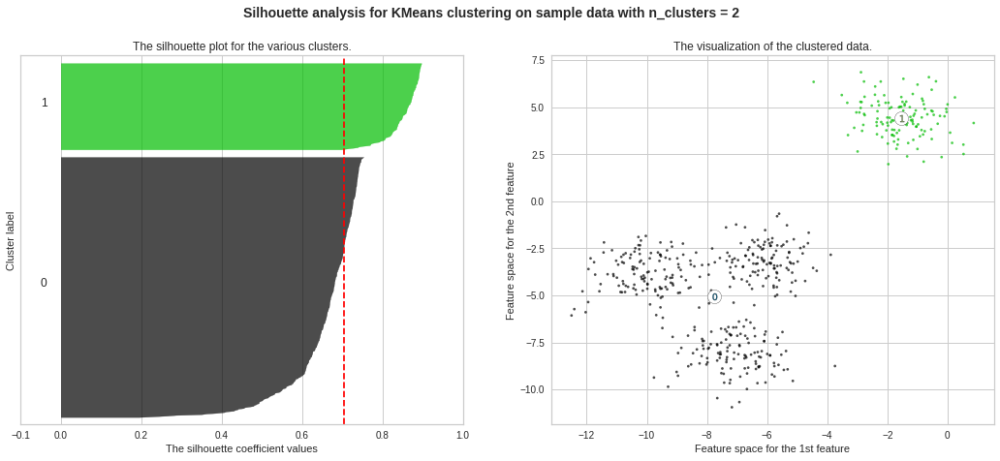

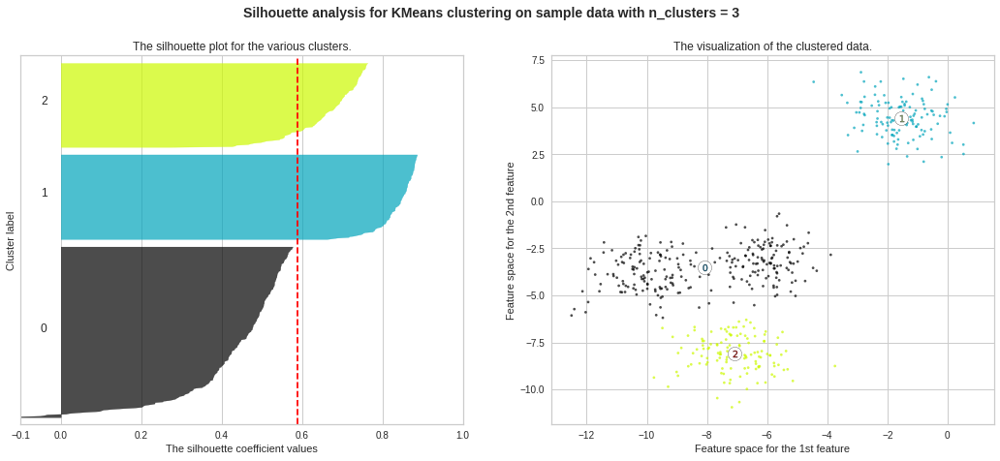

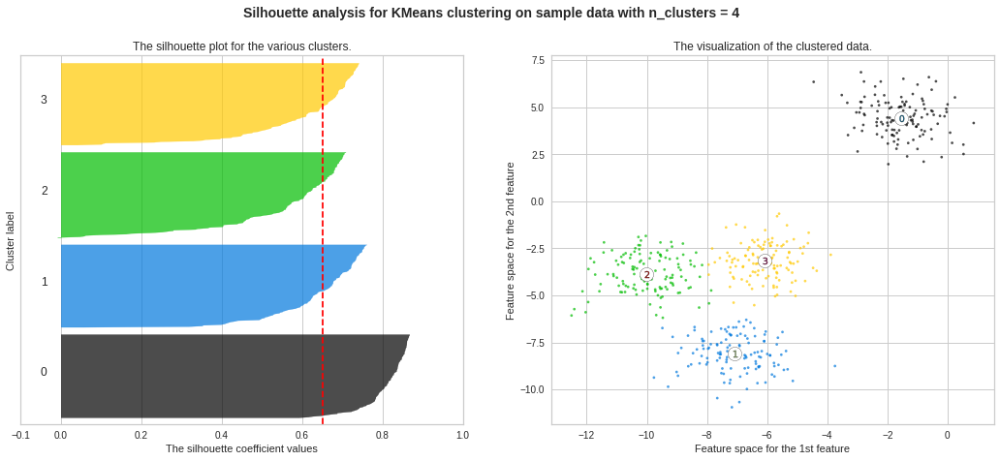

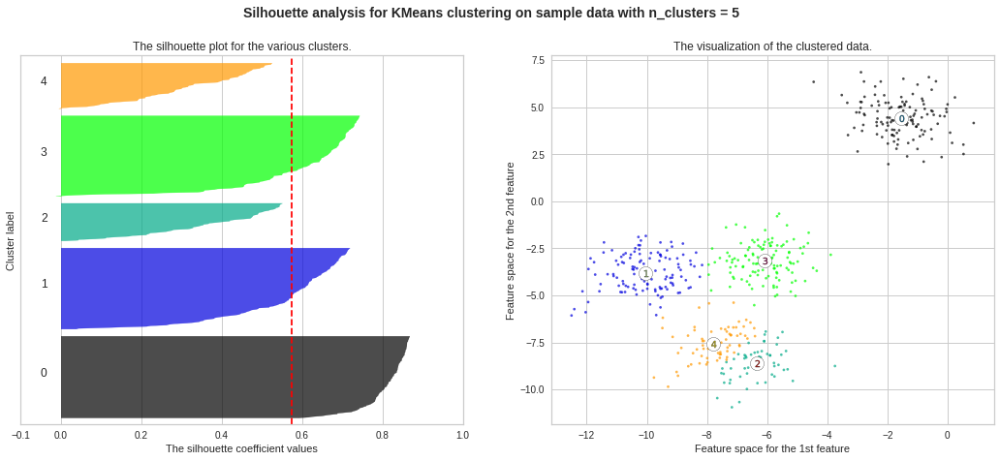

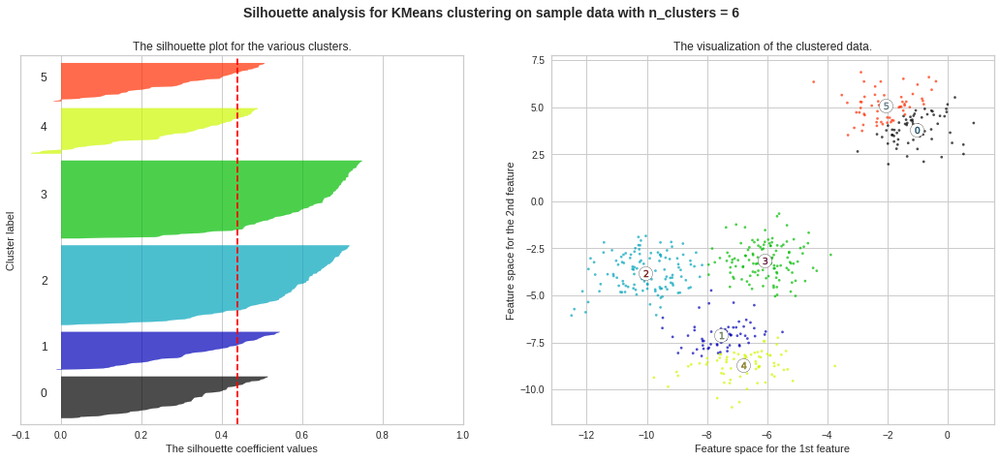

In [71]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=4,
                  cluster_std=1,
                  center_box=(-10.0, 10.0),
                  shuffle=True,
                  random_state=1)  # For reproducibility

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

Observations from above Silhouette Plots:

- The silhouette plot shows that the n_cluster value of 3 is a bad pick, as all the points in the cluster with cluster_label=0 are below-average silhouette scores.
- The silhouette plot shows that the n_cluster value of 5 is a bad pick, as all the points in the cluster with cluster_label=2 and 4 are below-average silhouette scores.
- The silhouette plot shows that the n_cluster value of 6 is a bad pick, as almost all the points in the cluster with cluster_label=0,1,4 and 5 are below-average silhouette scores, and also due to the presence of outliers.
- Silhouette analysis is more ambivalent in deciding between 2 and 4.
- The thickness of the silhouette plot for the cluster with cluster_label=0 when n_clusters=2, is bigger in size owing to the grouping of the 3 sub-clusters into one big cluster.
- For n_clusters=4, all the plots are more or less of similar thickness and hence are of similar sizes, as can be considered as best ‘k’.


Using `scikit-learn.metrics` on our IMC data, loop through values of k again, computing the silhouette coefficient (this takes a LOOONG time i.e. ~2 hr wall time):

```python
%%time
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(X_scaled)
    score = silhouette_score(X_scaled, kmeans.labels_)
    print('K =', k, 'silhouette score =', score)
    silhouette_coefficients.append(score)
```

```
K = 2 silhouette score = 0.44510556032557064
K = 3 silhouette score = 0.13272987832688307
K = 4 silhouette score = 0.13636804789058554
K = 5 silhouette score = 0.1394940962768057
K = 6 silhouette score = 0.13849795323564695
K = 7 silhouette score = 0.1409242340951432
K = 8 silhouette score = 0.07781204586066344
K = 9 silhouette score = 0.06489030156571994
K = 10 silhouette score = 0.07091744256577782
CPU times: user 5h 11min 1s, sys: 51min 15s, total: 6h 2min 16s
Wall time: 1h 56min 58s
```

Plotting the average silhouette scores for each _k_ shows that the best choice for _k_ is 3 since it has the maximum score:

In [72]:
silhouette_coefficients = [0.44510556032557064,
 0.13272987832688307,
 0.13636804789058554,
 0.1394940962768057,
 0.13849795323564695,
 0.1409242340951432,
 0.07781204586066344,
 0.06489030156571994,
 0.07091744256577782]

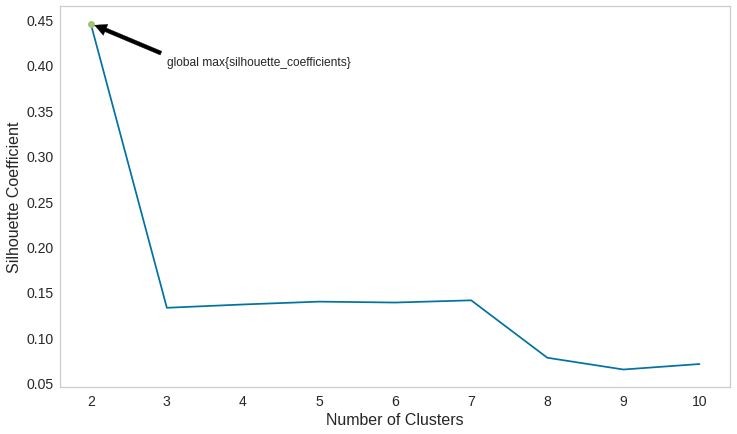

In [73]:
fig_fn = '%s/BMED320_experiments_case6126_E08_silhouette_coefficient_number_of_clusters.pdf' % fn_fig_base
#plt.style.use("fivethirtyeight")

fig, ax = plt.subplots(1,1)
fig.set_size_inches(12, 7)


plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters", size=16)
plt.ylabel("Silhouette Coefficient", size=16)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)

# annotation
y_adhoc = 0.4
plt.plot([2], [silhouette_coefficients[2-2]], 'o')
plt.annotate('global max{silhouette_coefficients}', xy=(2, silhouette_coefficients[2-2]), 
             xytext=(2+1, y_adhoc), fontsize=12,
            arrowprops=dict(facecolor='black', shrink=0.05))

plt.grid()
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

Ultimately, your decision on the number of clusters to use should be guided by a combination of domain knowledge and clustering evaluation metrics.

```python
%%time
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


fig_fn = '%s/BMED320_experiments_case6126_E08_silhouette_scores_of_clusters.pdf' % fn_fig_base

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 1 column
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(("Silhouette analysis for KMeans clustering on IMC data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.savefig(fig_fn, bbox_inches='tight')
plt.show()
```

```python
For n_clusters = 2 The average silhouette_score is : 0.4451465877506853
For n_clusters = 3 The average silhouette_score is : 0.13284362598409535
For n_clusters = 4 The average silhouette_score is : 0.13611037518871638
For n_clusters = 5 The average silhouette_score is : 0.13892110255788137
For n_clusters = 6 The average silhouette_score is : 0.13957083093593337

CPU times: user 5h 33min 8s, sys: 56min 44s, total: 6h 29min 52s
Wall time: 2h 10min 5s
```

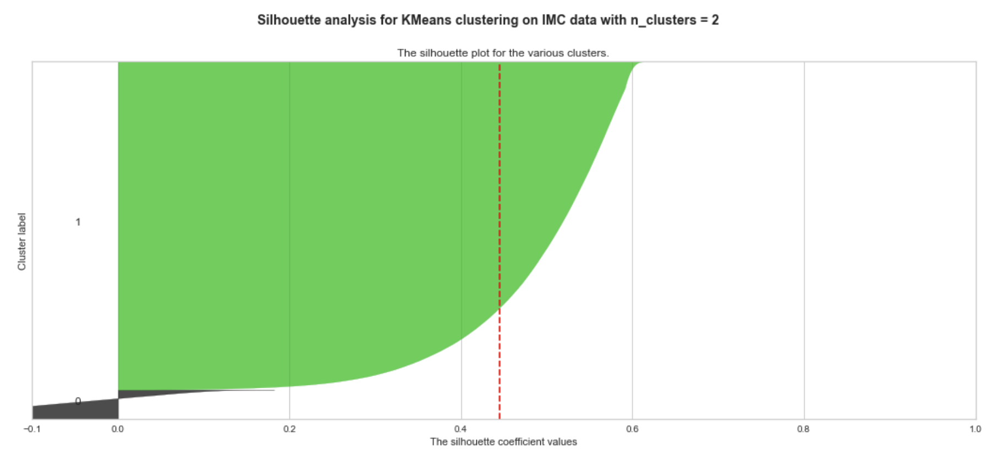

In [74]:
from IPython.display import Image
Image(filename='./assets/silhouette_2.png', width=600)

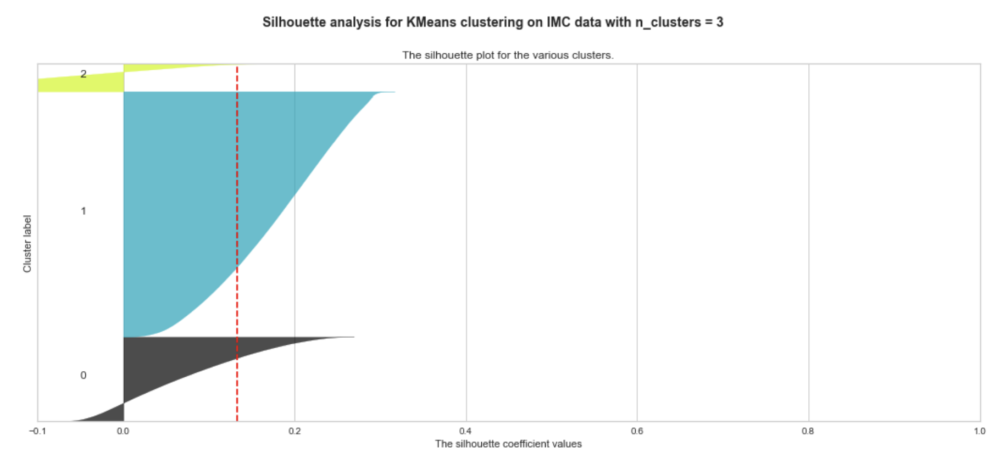

In [75]:
from IPython.display import Image
Image(filename='./assets/silhouette_3.png', width=600)

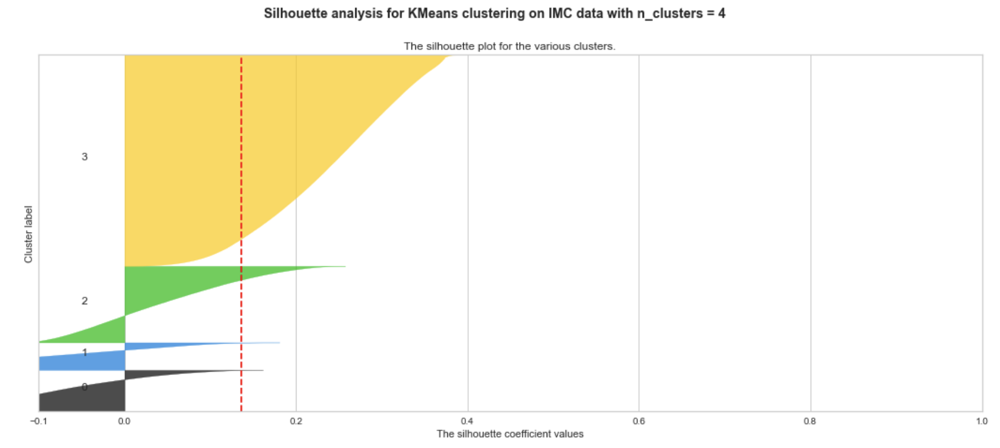

In [76]:
from IPython.display import Image
Image(filename='./assets/silhouette_4.png', width=600)

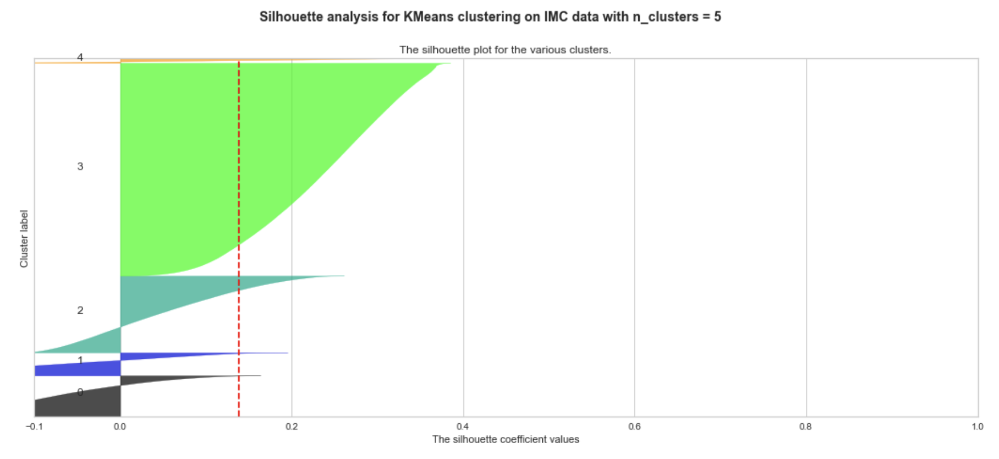

In [77]:
from IPython.display import Image
Image(filename='./assets/silhouette_5.png', width=600)

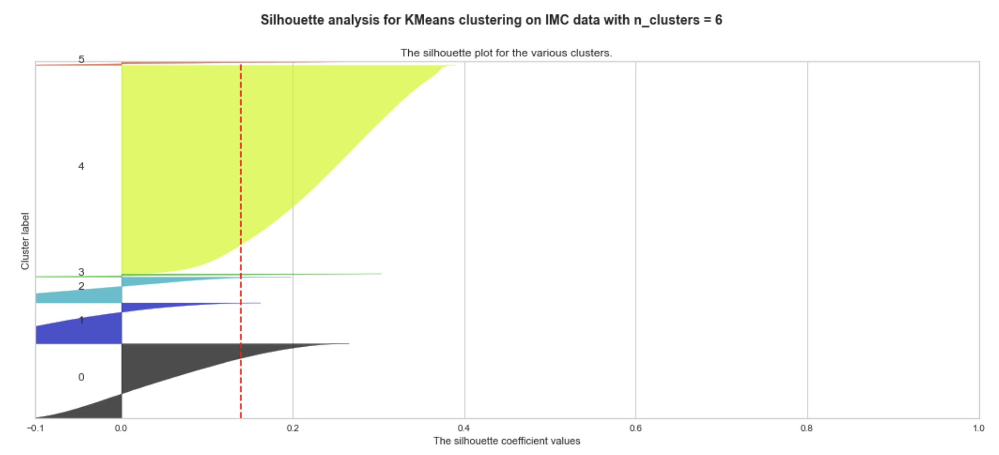

In [78]:
from IPython.display import Image
Image(filename='./assets/silhouette_6.png', width=600)

### K-means segmentation showing selected feature channels

In [79]:
K = 7  # Number of clusters (3 is elbow point, 2 is silhouette, 7 is "nice")
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs='deprecated',
       precompute_distances='deprecated', random_state=42, tol=0.0001,
       verbose=0)


In [80]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 1min 14s, sys: 711 ms, total: 1min 14s
Wall time: 4.95 s


In [81]:
kmeans_segm = 0 * im_msk.copy()

In [82]:
for v in range(len(ind_roi[0])):
    kmeans_segm[ind_roi[0][v], ind_roi[1][v]] = kmeans_fit.labels_[v]

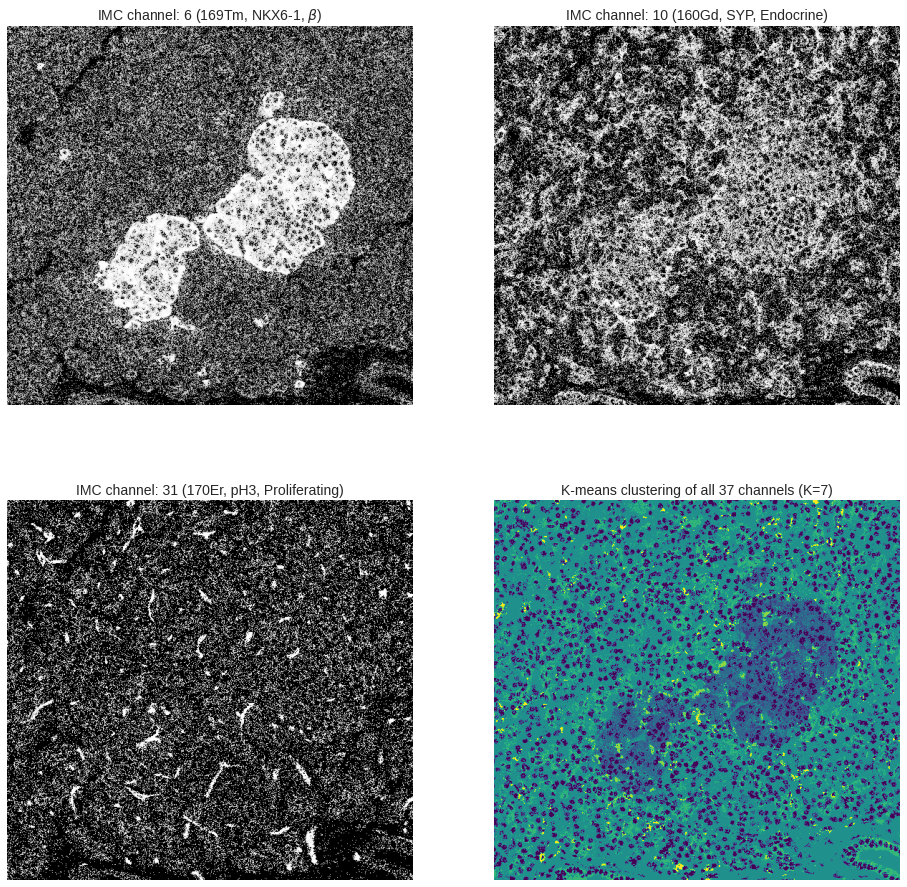

In [83]:
fig_fn = '%s/BMED320_experiments_case6126_E08_selected_channels_and_k_means_clustering.pdf' % fn_fig_base

# Select channels (-1 i.e. we are starting at channel 0)
c = [5, 9, 30]

def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)


fig, axes = plt.subplots(2,2, figsize=(16,16))
ax = axes.ravel()
chn = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel: %d (%s, %s, %s)' % (c[0]+1,
                                                df_p_edit['Metal Tag'].iloc[c[0]],
                                                df_p_edit['Short Name'].iloc[c[0]],
                                                df_p_edit['Main Target Cells'].iloc[c[0]]), size=14)

chn = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel: %d (%s, %s, %s)' % (c[1]+1,
                                                df_p_edit['Metal Tag'].iloc[c[1]],
                                                df_p_edit['Short Name'].iloc[c[1]],
                                                df_p_edit['Main Target Cells'].iloc[c[1]]), size=14)

chn = np.flip(np.squeeze(im[c[2],:,:]), axis=0)
ax[2].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('IMC channel: %d (%s, %s, %s)' % (c[2]+1, 
                                        df_p_edit['Metal Tag'].iloc[c[2]],
                                        df_p_edit['Short Name'].iloc[c[2]],
                                        df_p_edit['Main Target Cells'].iloc[c[2]]), size=14)                                          

ax[3].imshow(np.flip(kmeans_segm[:, :], axis=0), cmap='viridis', origin='lower')  #'viridis', 'gray'
ax[3].set_title('K-means clustering of all %d channels (K=%d)' % (n_chn, K), size=14)
ax[3].axis('off')

#plt.tight_layout
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

### K-means segmentation with varying K 

In [84]:
def k_means_explore(k, img, mask, kmeans_kwargs):
    kmeans_model = KMeans(n_clusters=k, **kmeans_kwargs)
    print(kmeans_model)   
    
    # Find voxel locations (ind_roi) corresponding to tissue ROI (value >=1 inside ROI, 0 else) 
    ind_roi = np.where(mask > 0) 
    X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
    
    scaler = StandardScaler()  
    scaler.fit(X.astype(float))
    scaled_features = scaler.transform(X.astype(float))  

    
    kmeans_fit = kmeans_model.fit(scaled_features)
    kmeans_segm = 0 * mask.copy()
    for v in range(len(ind_roi[0])):
        kmeans_segm[ind_roi[0][v], ind_roi[1][v]] = kmeans_fit.labels_[v]
        
    return kmeans_segm

KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=1,
       n_init=10, n_jobs='deprecated', precompute_distances='deprecated',
       random_state=42, tol=0.0001, verbose=0)
KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=2,
       n_init=10, n_jobs='deprecated', precompute_distances='deprecated',
       random_state=42, tol=0.0001, verbose=0)
KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=3,
       n_init=10, n_jobs='deprecated', precompute_distances='deprecated',
       random_state=42, tol=0.0001, verbose=0)
KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=4,
       n_init=10, n_jobs='deprecated', precompute_distances='deprecated',
       random_state=42, tol=0.0001, verbose=0)
KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=5,
       n_init=10, n_jobs='deprecated', precompute_distances='deprecated',
       random_state=42, tol=0.0001, v

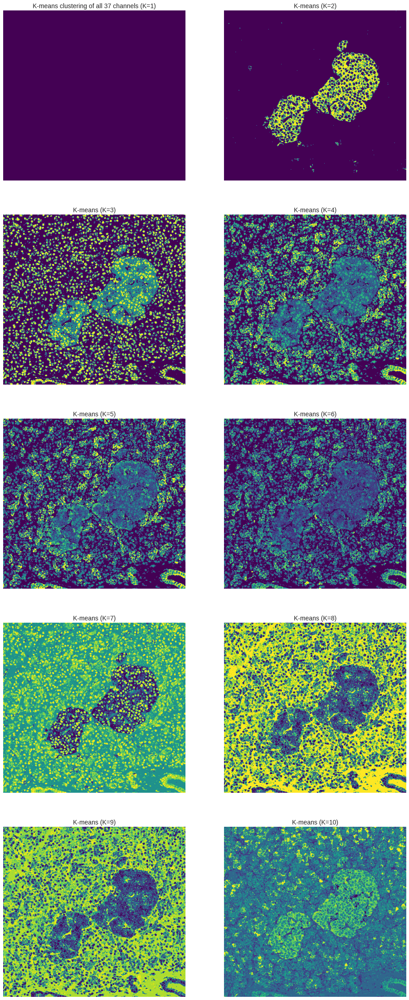

CPU times: user 9min 15s, sys: 5.32 s, total: 9min 21s
Wall time: 39.6 s


In [85]:
%%time

fig_fn = '%s/BMED320_experiments_case6126_E08_k_means_clustering_k_1_10.pdf' % fn_fig_base

kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "tol": 0.0001,
    "random_state": 42,
}

my_img = im
my_mask = im[0,:,:]+1
my_n_chn = my_img.shape[0]

fig, axes = plt.subplots(5, 2, figsize=(16, 40), sharex=False, sharey=False)
ax = axes.ravel()

for k in range(0, 10):
    K=k+1
    kmeans_segm = k_means_explore(K, my_img, my_mask, kmeans_kwargs)

    ax[k].imshow(np.flip(kmeans_segm[:, :], axis=0), cmap='viridis', origin='lower')  #'viridis', 'gray'
    if k==0:
        ax[k].set_title('K-means clustering of all %d channels (K=%d)' % (my_n_chn, K), size=14)
    else:
        ax[k].set_title('K-means (K=%d)' % (K), size=14)    
    ax[k].axis('off')
    
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

## Display DNA only (cell nuclei)  i.e. chn 36 (Ir191) and chn 37 (Ir193)
Hint from Jørn Skavland (Jorn.Skavland@uib.no) Oct 1st 2020 at https://www.uib.no/en/ccbio/136800/hyperion-imaging-system

### Cell nuclei segmentation using point-wise max of DNA channel signal and 
### Histogram-based thresholding (Otsu's method) https://en.wikipedia.org/wiki/Otsu%27s_method
(for better segmentation we could consider a two-dimensional Otsu's method, or adaptive thresholding)

See also:
- https://github.com/selamgit/Irregular-Grid-for-Local-Otsu-Segmentation
- https://github.com/pedrofrodenas/image-thresholding-OCR
- https://github.com/Liang-yc/IntegralThreshold
- https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Global_Thresholding_Adaptive_Thresholding_Otsus_Binarization_Segmentations.php

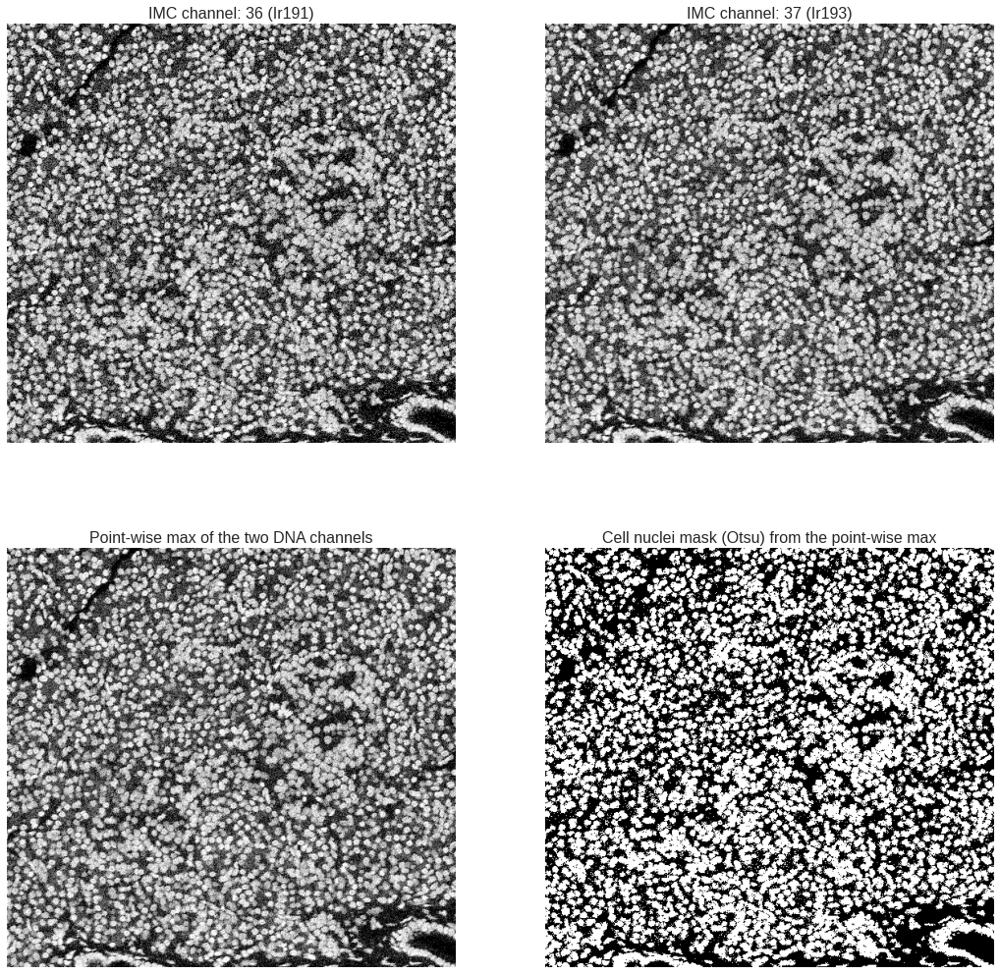

In [86]:
fig_fn = '%s/BMED320_experiments_case6126_E08_DNA_channels_otsu_binarization.pdf' % fn_fig_base

# Select channels (-1 i.e. we are starting at channel 0)
c = [35, 36]

def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)

fig, axes = plt.subplots(2,2, figsize=(18,18))
ax = axes.ravel()
chn0 = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn0), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel: %d (%s)' % (c[0]+1, df.chn.iloc[c[0]]), size=16)

chn1 = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel: %d (%s)' % (c[1]+1, df.chn.iloc[c[1]]), size=16)

#chn = (chn0+chn1)/2   mean
chn = np.maximum(chn0, chn1)  # point-wise maximum of the two DNA channels
ax[2].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('Point-wise max of the two DNA channels', size=16)

t = threshold_otsu(hist_eq(chn))
mask = hist_eq(chn) > t
# mask = ndimage.median_filter(hist_eq(chn)

# ax[3].imshow(mask, cmap='viridis', origin='lower')  #'viridis', 'gray'
ax[3].imshow(mask, cmap='gray', origin='lower')  #'viridis', 'gray'
ax[3].set_title('Cell nuclei mask (Otsu) from the point-wise max', size=16)
ax[3].axis('off')

plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

In [87]:
# The cell candidate mask (to be saved to TIFF)
print(mask.min(), mask.max())
mask = np.flip(img_as_ubyte(mask), axis=0)
print(mask.min(), mask.max())

False True
0 255


In [88]:
# Save cell mask as tiff
#tiff.imsave('%s/Desktop/cell_mask.tiff' % (home), mask)
tiff.imsave('./data/E08_cell_candidate_mask.tiff', mask)

### Cell segmentation using the 3 nucleus channels: Histone H3  nuclei (chn1) and DNA (chn36, chn 37)

###  Experiments with maskSLIC from `scikit-image`

SLIC = Simple Linear Iterative Clustering <br>

Cf.https://scikit-image.org/docs/dev/api/skimage.segmentation.html?highlight=slic#skimage.segmentation.slic

See also 
- https://www.epfl.ch/labs/ivrl/research/slic-superpixels/#SLICO
- https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_mask_slic.html#sphx-glr-auto-examples-segmentation-plot-mask-slic-py
- https://github.com/darshitajain/SLIC

This experiment is about comparing the segmentations obtained using the plain SLIC method [1] and its masked version maskSLIC [2].

The maskSLIC method is an extension of the SLIC method for the generation of superpixels in a region of interest. maskSLIC is able to overcome border problems that affects SLIC method, particularely in case of irregular mask.


[1] Radhakrishna Achanta, Appu Shaji, Kevin Smith, Aurelien Lucchi, Pascal Fua, and Sabine Suesstrunk, SLIC Superpixels Compared to State-of-the-art Superpixel Methods, [TPAMI](https://ieeexplore.ieee.org/document/6205760), May 2012. DOI:10.1109/TPAMI.2012.120

[2] Irving, Benjamin. “maskSLIC: regional superpixel generation with application to local pathology characterisation in medical images.”, 2016, [arXiv:1606.09518](https://arxiv.org/abs/1606.09518)

```
Segments image using k-means clustering in Color-(x,y,z) space:

skimage.segmentation.slic(image, n_segments=100, compactness=10.0, max_iter=10, sigma=0, spacing=None, 
multichannel=True, convert2lab=None, enforce_connectivity=True, min_size_factor=0.5, max_size_factor=3, slic_zero=False, start_label=None, mask=None)

n_segments - The (approximate) number of labels in the segmented output image

compactness - Balances color proximity and space proximity. Higher values give more weight to space proximity, making superpixel shapes more square/cubic. In SLICO mode, this is the initial compactness. 
This parameter depends strongly on image contrast and on the shapes of objects in the image. 
We recommend exploring possible values on a log scale, e.g., 0.01, 0.1, 1, 10, 100, before refining around a chosen value

max_iter - Maximum number of iterations of k-means

sigma - Width of Gaussian smoothing kernel for pre-processing for each dimension of the image. 
The same sigma is applied to each dimension in case of a scalar value. Zero means no smoothing. Note, that sigma is automatically scaled if it is scalar and a manual voxel spacing is provided

````

In [89]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

#### Make a multichannel "RGB" image and mask using mathematical morphology

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


img: (530, 567, 3) 0.0 300509.0
lum: (530, 567) 0.0 0.9997831725505726
mmask: (530, 567) 0 1


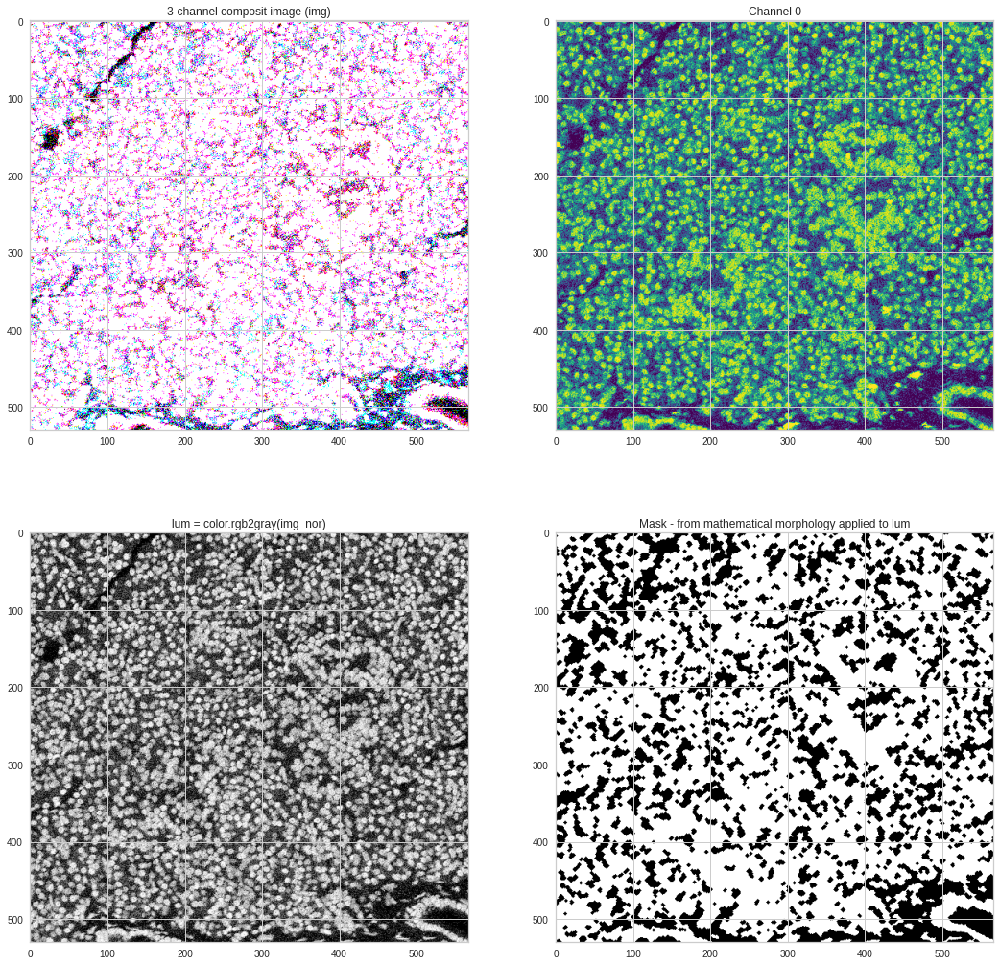

In [90]:
from skimage import data
from skimage import color
from skimage import morphology
from skimage import segmentation


img = np.zeros((im.shape[1],im.shape[2],3), dtype=float)
img[:,:,0] = hist_eq(np.squeeze(im[c[0],:,:]))
img[:,:,1] = hist_eq(np.squeeze(im[c[1],:,:]))
img[:,:,2] = hist_eq(np.squeeze(im[c[2],:,:]))
img_nor = img / np.max(img)


aa = 0.4    # 0.7
bb = 10     # 500
cc = 10     # 500
dd = 2      # 3

lum = color.rgb2gray(img_nor)

mmask = morphology.remove_small_holes(morphology.remove_small_objects(lum < aa, bb), cc)
mmask = 1- morphology.opening(mmask, morphology.disk(dd))

print("img:", img.shape, img.min(), img.max())
print("lum:", lum.shape, lum.min(), lum.max())
print("mmask:", mmask.shape, mmask.min(), mmask.max())

fig = plt.subplots(2,2, figsize=(18,18))
plt.subplot(2,2,1)
plt.imshow(img)
plt.title("3-channel composit image (img)")
plt.subplot(2,2,2)
plt.imshow(img[:,:,0], cmap='viridis')
plt.title("Channel %d" % (c[0]))
plt.subplot(2,2,3)
plt.imshow(lum, cmap='gray')
plt.title("lum = color.rgb2gray(img_nor)")
plt.subplot(2,2,4)
plt.imshow(mmask, cmap='gray')
plt.title("Mask - from mathematical morphology applied to lum")

plt.show()


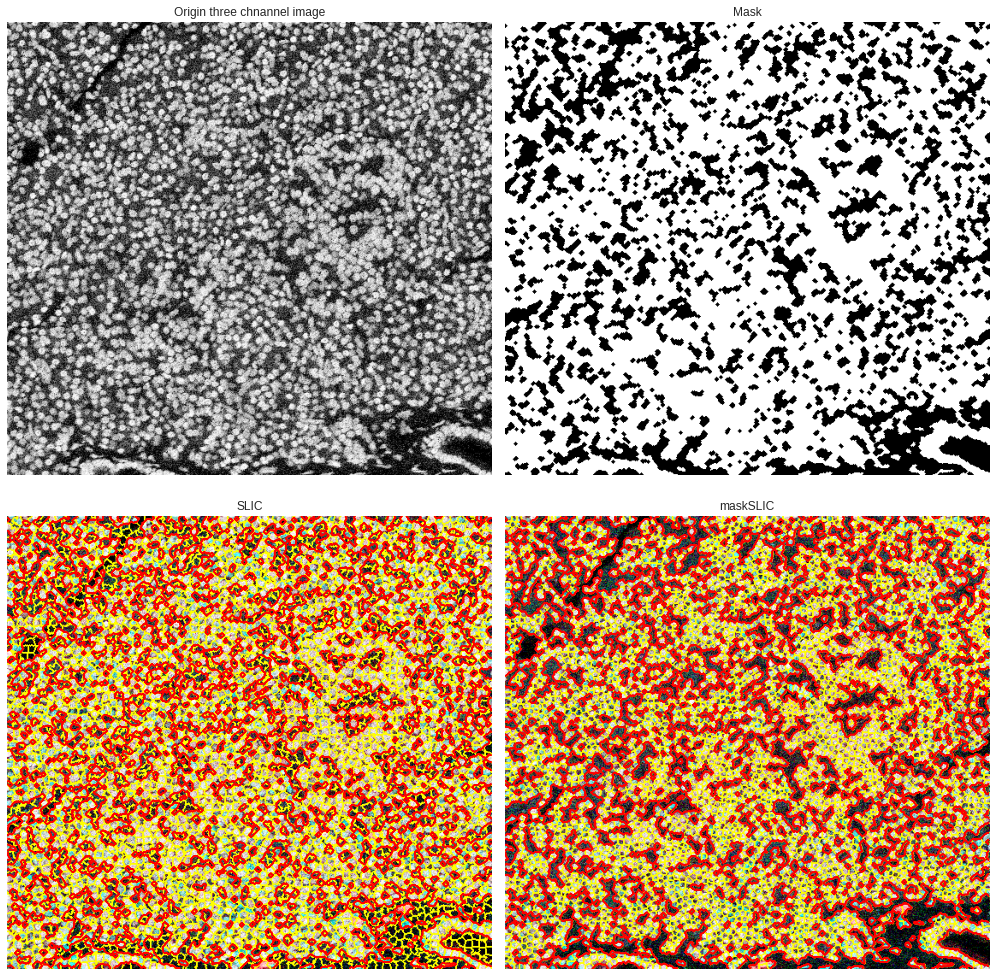

CPU times: user 35.4 s, sys: 47.8 ms, total: 35.5 s
Wall time: 35.4 s


In [91]:
%%time
n_segments = 5000  # 200
m_n_segments = 5000 # 100

compactness =  50   # 0.01, 0.1, 1, 10, 100   [default 10.0]

# SLIC result
slic = segmentation.slic(img_nor, n_segments=n_segments, compactness=compactness, start_label=1)

# maskSLIC result
m_slic = segmentation.slic(img_nor, 
                           n_segments=m_n_segments,
                           max_iter=100,
                           spacing=None,
                           multichannel=True,
                           sigma=10.5,
                           compactness=compactness,
                           enforce_connectivity=True,
                           slic_zero=False,
                           mask=mmask, 
                           start_label=1)

# Display result
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(14, 14))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(lum, cmap='gray')
ax1.set_title("Origin three chnannel image")

ax2.imshow(mmask, cmap="gray")
ax2.set_title("Mask")

ax3.imshow(segmentation.mark_boundaries(img_nor, slic))
ax3.contour(mmask, colors='red', linewidths=1)
ax3.set_title("SLIC")

ax4.imshow(segmentation.mark_boundaries(img_nor, m_slic))
ax4.contour(mmask, colors='red', linewidths=1)
ax4.set_title("maskSLIC")

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

### Make a pointwise max image and a cell mask using median filtering, followed by Otsu's binarization method

In [92]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

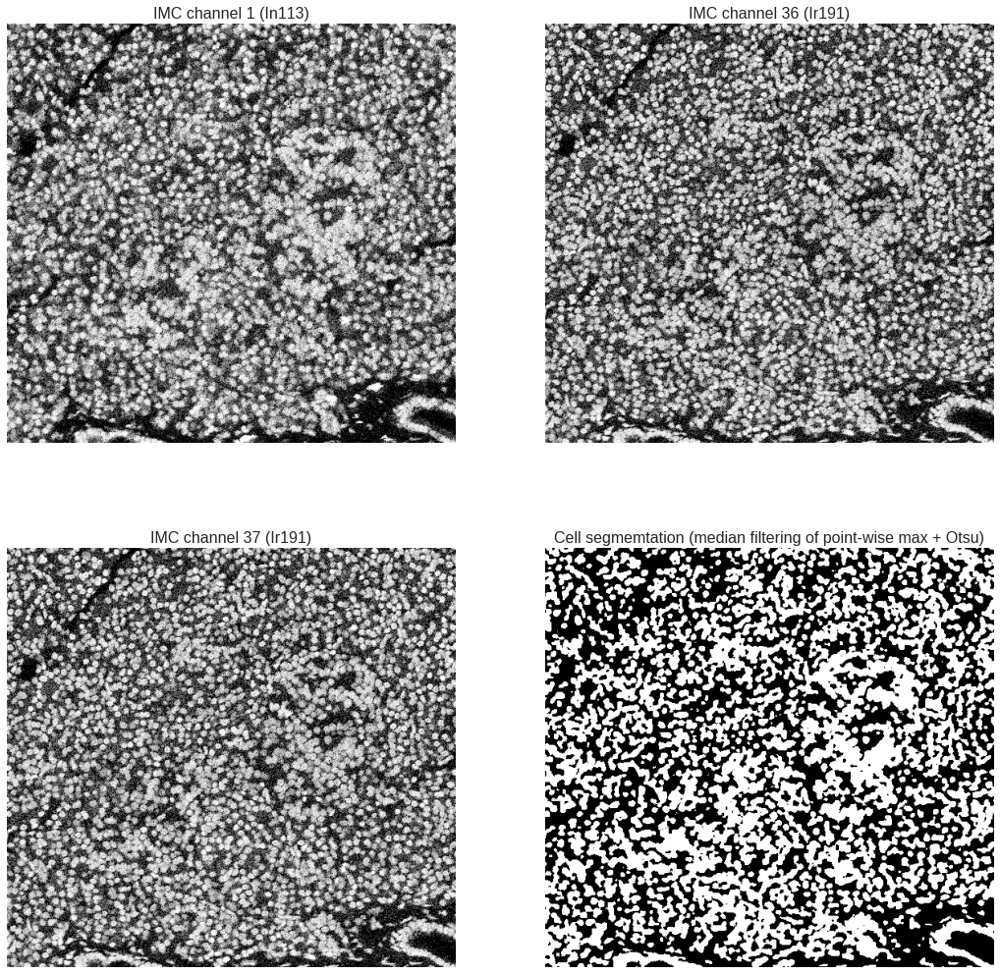

In [93]:
fig, axes = plt.subplots(2,2, figsize=(18,18))
ax = axes.ravel()
chn0 = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn0), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel %d (%s)' % (c[0]+1, df.chn.iloc[c[0]]), size=16)

chn1 = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel %d (%s)' % (c[1]+1, df.chn.iloc[c[1]]), size=16)

chn2 = np.flip(np.squeeze(im[c[2],:,:]), axis=0)
ax[2].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('IMC channel %d (%s)' % (c[2]+1, df.chn.iloc[c[1]]), size=16)


chn01 = np.maximum(chn0, chn1)  # point-wise maximum of the two DNA channels
chn = np.maximum(chn01, chn2)  # point-wise maximum of the all three channels
chn_eq = hist_eq(chn) # histogram equalization
r = 2
chn_eq_med = median(chn_eq, disk(r)) # median filtering

# Some mathematical morphology to consider:
# see: https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_regional_maxima.html
# https://scikit-image.org/docs/dev/auto_examples/filters/plot_tophat.html

t = threshold_otsu(chn_eq_med)
mask = chn_eq_med > t

# mask = ndimage.median_filter(hist_eq(chn)

ax[3].imshow(mask, cmap='gray', origin='lower')
ax[3].set_title('Cell segmemtation (median filtering of point-wise max + Otsu)', size=16)
ax[3].axis('off')
plt.show()

In [94]:
# The cell candidate mask (to be saved to TIFF)
print(mask.min(), mask.max())
mask = np.flip(img_as_ubyte(mask), axis=0)
print(mask.min(), mask.max())

False True
0 255


In [95]:
# Save cell mask as tiff
#tiff.imsave('%s/Desktop/cell_mask.tiff' % (home), mask)
tiff.imsave('./data/E08_cell_candidate_mask.tiff', mask)

## Make a Pandas dataframe of all pixel signatures within the cell candidate mask

#### Channel names

In [96]:
chn_names = list(df.chn.iloc[:])

In [97]:
# Since cells are all over the slide, we could also let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

### However, we will use a restricted ROI mask for the cells in the slide.
**Find voxel locations (ind_roi) corresponding to cell ROI (value >=1 inside ROI, 0 else) using Numpy's `where`**

In [98]:
ind_roi = np.where(mask > 0)
print('Total number of pixels: %d, Number of pixels within cell candidates: %d (%.1f%%)' % \
      (len(im_msk.flatten()), len(ind_roi[0]), 100*len(ind_roi[0])/len(im_msk.flatten())))

Total number of pixels: 300510, Number of pixels within cell candidates: 150526 (50.1%)


### Extracting a dataset X and the corresponding pixel locations into a Pandas data frame (dfROI)

In [99]:
X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
print(X.shape)
dfROI = pd.DataFrame(X, columns = zip(range(len(chn_names)), chn_names))

(150526, 37)


### Check feature vectors (CyTOF pixel signatures) for the ten first pixels within the cells ROI

In [100]:
dfROI.head(10).T   # .T as column vectors

,0,1,2,3,4,5,6,7,8,9
"(0, In113)",11.754000,18.483999,15.564000,19.813000,9.268000,8.750000,6.564,3.391000,21.261999,16.070999
"(1, In115)",3.143000,1.332000,3.129000,2.000000,1.000000,2.000000,1.000,1.361000,1.000000,0.000000
"(2, Pr141)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"(3, Nd142)",1.000000,1.275000,0.000000,0.000000,0.000000,1.026000,0.000,2.000000,2.000000,0.000000
"(4, Nd143)",8.871000,3.000000,1.000000,0.000000,1.000000,4.491000,4.778,2.466000,0.000000,1.497000
"(5, Nd144)",5.189000,3.032000,2.126000,3.000000,0.000000,2.814000,0.000,0.000000,0.000000,1.532000
"(6, Nd145)",0.000000,0.000000,1.912000,0.000000,0.000000,1.000000,0.000,0.000000,1.000000,0.000000
"(7, Nd146)",2.414000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"(8, Sm147)",0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,4.095000
"(9, Nd148)",6.969000,4.158000,0.000000,0.000000,0.000000,0.758000,2.105,3.590000,3.000000,6.821000


### Check feature vectors (CyTOF pixel signatures) for the ten last pixels within the ROI

In [101]:
dfROI.tail(10).T

,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525
"(0, In113)",21.837999,21.924999,18.957001,35.752998,27.349001,14.342000,30.667000,29.274000,23.422001,16.829
"(1, In115)",5.675000,4.000000,1.274000,1.000000,4.664000,2.000000,2.838000,1.853000,0.000000,4.459
"(2, Pr141)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000
"(3, Nd142)",0.000000,0.000000,0.000000,0.000000,1.213000,0.000000,0.000000,0.000000,0.000000,0.000
"(4, Nd143)",0.000000,1.000000,0.000000,1.468000,0.000000,0.000000,0.000000,0.000000,1.029000,0.000
"(5, Nd144)",0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,1.282000,1.751000,1.344000,3.032
"(6, Nd145)",0.000000,0.000000,0.000000,1.316000,0.000000,0.000000,0.000000,2.413000,0.000000,0.000
"(7, Nd146)",0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.037000,0.000000,0.000
"(8, Sm147)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000
"(9, Nd148)",0.000000,0.000000,6.463000,0.000000,1.674000,0.000000,0.000000,0.000000,3.779000,0.000


### Insert pixel locations (row,col) from the ROI into the dfROI data frame

In [102]:
dfROI.insert(loc = len(dfROI.columns),
           column = 'row',
           value = ind_roi[0])  # Row of pixel location
dfROI.insert(loc = len(dfROI.columns),
           column = 'col',
           value = ind_roi[1])  # Col of pixel location

### and inspect the result

In [103]:
print(dfROI.columns[0],',...,',dfROI.columns[-3], ',', dfROI.columns[-2],',', dfROI.columns[-1])

(0, 'In113') ,..., (36, 'Ir193') , row , col


In [104]:
print(dfROI.iloc[0][-3:])
print(dfROI.iloc[-1][-3:])

(36, Ir193)    18.249001
row             0.000000
col             1.000000
Name: 0, dtype: float64
(36, Ir193)     27.128
row            529.000
col            566.000
Name: 150525, dtype: float64


## Restriction to a small, quadratic 64 x 64 ROI within the slide

(64, 64)
(530, 567)


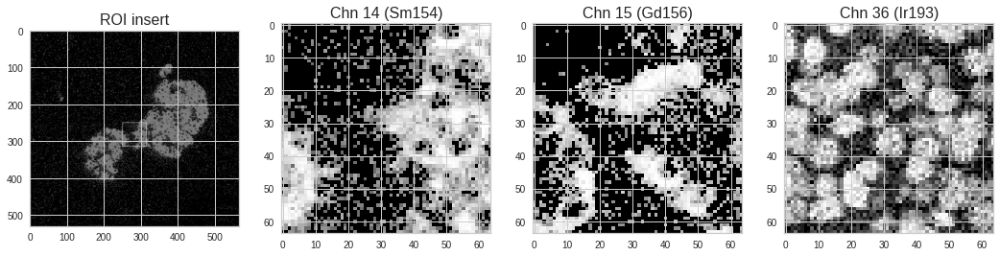

In [105]:
my_chn = [14, 15, 36]

rl=250; ru=314
cl=250; cu=314
msk2 = hist_eq(im[my_chn[0],rl:ru, cl:cu])+1
print(msk2.shape)

ima = hist_eq(np.squeeze(im[my_chn[0],:, :]))
print(ima.shape)
mx = hist_eq(im[my_chn[0],:,:]).max()*2
ima[rl:ru,cl] = mx
ima[rl:ru,cu] = mx
ima[rl,cl:cu] = mx
ima[ru,cl:cu] = mx


fig, axes = plt.subplots(1,4, figsize=(18,15))
plt.subplot(1,4,1)
plt.imshow(ima, cmap='gray')
plt.title('ROI insert', size=16)
plt.subplot(1,4,2)
plt.imshow(hist_eq(im[my_chn[0],rl:ru, cl:cu]), cmap='gray')
plt.title('Chn %d (%s)' % (my_chn[0], chn_names[my_chn[0]]), size=16)
plt.subplot(1,4,3)
plt.imshow(hist_eq(im[my_chn[1],rl:ru, cl:cu]), cmap='gray')
plt.title('Chn %d (%s)' % (my_chn[1], chn_names[my_chn[1]]), size=16)
plt.subplot(1,4,4)
plt.imshow(hist_eq(im[my_chn[2],rl:ru, cl:cu]), cmap='gray')
plt.title('Chn %d (%s)' % (my_chn[2], chn_names[my_chn[2]]), size=16)
plt.show()

### Make a multichannel IMC image of the small 64 x 64 ROI insert

In [106]:
roi_insert = np.zeros(shape=(msk2.shape[0], msk2.shape[1], 1, len(chn_names)))
roi_insert_eq = np.zeros(shape=(msk2.shape[0], msk2.shape[1], 1, len(chn_names)))
print(roi_insert.shape)
for i in range(len(chn_names)):
    a = im[i,rl:ru, cl:cu]
    b = hist_eq(im[i,rl:ru, cl:cu])
    roi_insert[:,:,0,i] = a  # /a.max()
    roi_insert_eq[:,:,0,i] = b  # /b.max()

(64, 64, 1, 37)


### Make a neuroimaging NIFTI-formated multichannel image (for using neuroimaging tools like FreeView)

In [107]:
roi_nii = nib.Nifti1Image(roi_insert, affine=np.eye(4))
roi_nii_eq = nib.Nifti1Image(roi_insert_eq, affine=np.eye(4))  # "histogram equalized channels" image

#### Save this NIFT image to disk

In [108]:
nib.save(roi_nii, './data/roi_insert.nii.gz')
nib.save(roi_nii_eq, './data/roi_insert_eq.nii.gz')

# K-means clustering using scikit-learn

### Cell segmentation using the 3 nucleus channels: Histone H3 nuclei (chn1) and DNA (chn36, chn 37)

In [109]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

In [110]:
# Generally, we could use a restricted ROI mask for the cells in the slide. 
# Since cells are all over the slide, we let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

In [111]:
# Find voxel locations (ind_roi) corresponding to tissue ROI (value >=1 inside ROI, 0 else) 
ind_roi = np.where(im_msk > 0) 

#### Make it into RGB space

In [112]:
r = np.squeeze(im[c[0],:,:]); r = hist_eq(r); r = np.uint8(255.0 * r/np.max(r))
g = np.squeeze(im[c[1],:,:]); g = hist_eq(g); g = np.uint8(255.0 * g/np.max(g))
b = np.squeeze(im[c[2],:,:]); b = hist_eq(b); b = np.uint8(255.0 * b/np.max(b))

dims = list(np.squeeze(im[0,:,:]).shape)
dims.append(3)
dna_rgb = np.zeros(shape=dims, dtype=np.uint8)
dna_rgb[:,:,0] = r; dna_rgb[:,:,1] = g; dna_rgb[:,:,2] = b

print(dna_rgb.shape)
print(type(dna_rgb))
print(dna_rgb.dtype)
mx = np.max(color.rgb2gray(dna_rgb))

tiff.imsave('%s/tmp/dna_rgb.tiff' % (home), dna_rgb)
tiff.imsave('%s/tmp/dna_rgb2gray.tiff' % (home), np.uint8(255*color.rgb2gray(dna_rgb)/mx))

(530, 567, 3)
<class 'numpy.ndarray'>
uint8


In [113]:
dims = np.prod(np.squeeze(im[0,:,:]).shape)
dataset = np.zeros(shape=[dims, 3]) # , dtype=np.uint8)
dataset[:,0] = r.flatten()
dataset[:,1] = g.flatten()
dataset[:,2] = b.flatten()
dataset.shape

(300510, 3)

In [114]:
data = pd.DataFrame(data=dataset, columns=['chn01', 'chn36', 'chn37'])
data

,chn01,chn36,chn37
0,42.0,97.0,0.0
1,191.0,132.0,168.0
2,221.0,253.0,245.0
3,210.0,249.0,251.0
4,226.0,241.0,251.0
...,...,...,...
300505,205.0,229.0,237.0
300506,245.0,247.0,252.0
300507,244.0,240.0,241.0
300508,234.0,216.0,209.0


In [115]:
scaler = StandardScaler()  
scaler.fit(data.astype(float))

dna_names = df.chn[c]
X = data
X_scaled = scaler.transform(X.astype(float))  

# Make data frame from scaled X to check scaling
dX_scaled = pd.DataFrame(X_scaled, columns=dna_names)
dX_scaled.head().T

,0,1,2,3,4
chn,,,,,
In113,-1.091671,0.864903,1.258844,1.114399,1.324501
Ir191,-0.327223,0.115113,1.644330,1.593777,1.492672
Ir193,-1.672050,0.559668,1.582538,1.662243,1.662243


In [116]:
dX_scaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
chn,,,,,,
In113,300510.0,-0.0,1.0,-1.6432,0.0245,1.7053
Ir191,300510.0,0.0,1.0,-1.5531,0.0519,1.6696
Ir193,300510.0,-0.0,1.0,-1.6721,0.0150,1.7154


In [117]:
K = 4  # Number of clusters (cell / no-cell / intermediate)
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs='deprecated',
       precompute_distances='deprecated', random_state=42, tol=0.0001,
       verbose=0)


In [118]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 18.3 s, sys: 422 ms, total: 18.7 s
Wall time: 1.23 s


In [119]:
kmeans_segm = 0 * im_msk.copy()
print('Size of segmented image:', kmeans_segm.shape)
print('min:', kmeans_fit.labels_.min())
print('max:', kmeans_fit.labels_.max())
print('Number of clustered samples within ROI:', len(ind_roi[0]))

Size of segmented image: (530, 567)
min: 0
max: 3
Number of clustered samples within ROI: 300510


In [120]:
kmeans_segm = np.ravel(np.ones(dims)*kmeans_fit.labels_).reshape(np.squeeze(im[0,:,:]).shape)
kmeans_segm = np.uint8(kmeans_segm)
print(kmeans_segm.shape)
print(np.int8(kmeans_segm.min()), np.int8(kmeans_segm.max()))
unique, counts = np.unique(kmeans_segm, return_counts=True)
dict(zip(np.int8(unique), counts))

(530, 567)
0 3


{0: 78911, 1: 82403, 2: 69026, 3: 70170}

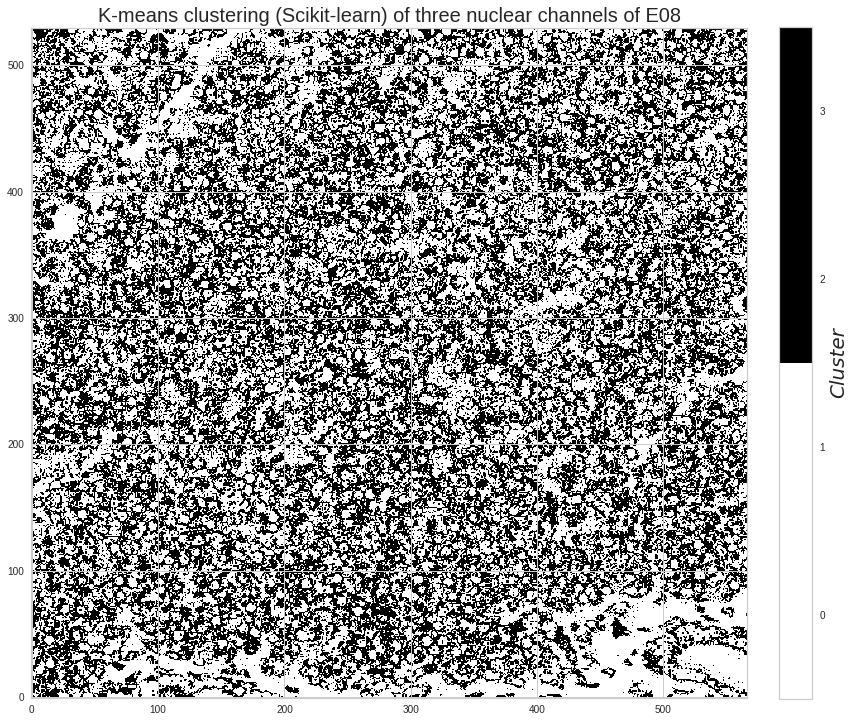

In [121]:
fig, axes = plt.subplots(1,1, figsize=(14,14))
# Possible colormaps: 'gray', 'jet', 'cubehelix', 
my_cmap = mpl.colors.ListedColormap(['#ffffff', '#ffffff','#000000', '#000000']) # 'blue'])
#plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=discrete_cmap(K, 'gray'), origin='lower') 
plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=my_cmap, origin='lower') 

# See: https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
im_ratio = kmeans_segm.shape[0]/kmeans_segm.shape[1]
cb = plt.colorbar(label='Cluster', orientation='vertical', fraction=0.046*im_ratio, pad=0.04)
ax = cb.ax
text = ax.yaxis.label
font = mpl.font_manager.FontProperties(family='times new roman', style='italic', size=20)
text.set_font_properties(font)


plt.clim(-0.5, K - 0.5)
labels = np.arange(0,K,1)
cb.set_ticks(labels)
cb.set_ticklabels(labels)



plt.title('K-means clustering (Scikit-learn) of three nuclear channels of E08', size=20)
plt.show()

In [122]:
tiff.imsave('%s/tmp/kmeans_segm.tiff' % (home), kmeans_segm)

Check: https://github.com/computational-medicine/BMED360-2020/blob/master/perfusion/01-perf-explore.ipynb for more